# Appendix A: Implementation code

# Title: Daily Stock Price Prediction With Multivariant TCN Model On The Singapore Market

## Import Liraries and functions


In [1]:
# import all libraries
import pandas as pd
import numpy as np
import math
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.graph_objects as go

# for statistical analysis
from statsmodels.tsa.stattools import adfuller
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from hurst import compute_Hc, random_walk
from scipy import stats
from statistics import mean

# for data collection
import yfinance as yf
import talib
import datetime
import json
import requests

# for data processing and modelling
from sklearn.preprocessing import MinMaxScaler, minmax_scale
import tensorflow as tf
import keras
import keras_tuner as kt
from tensorflow.keras import layers,Sequential
from keras.utils.vis_utils import plot_model
from keras.callbacks import EarlyStopping
from keras.models import load_model
from tcn import TCN

# filter out warnings messages as not all parameters will use GPU in model training
tf.get_logger().setLevel('ERROR')

In [2]:

def plot_history(history, title=None):
    """
    plot model training loss and validation loss against training epochs in a subplot; 
    plot model training MAE and validation MAE against training epochs in another subplot
    plot model training MAPE and validation MAPE against training epochs in another subplot
    
    Parameters
    ----------
    history: object
             model history callback object.
    Returns 
    -------
    fig: Figure object
        the figure of the plots.
    """
    import matplotlib.pyplot as plt
    fig, axs = plt.subplots(3,figsize = (8,8))
    plt.subplots_adjust(hspace=0.3, wspace=0.3)
    fig.suptitle(title, fontsize=12, y=0.98)

    # training loss and validation loss values
    loss = history.history["loss"]
    val_loss = history.history["val_loss"]
    
    # training mape and validation mae values
    mape = history.history["mape"]
    val_mape = history.history["val_mape"]
    epochs = range(1, len(loss) + 1) # epochs run
    
    # training mae and validation mae values
    mae = history.history["mae"]
    val_mae = history.history["val_mae"]
    epochs = range(1, len(loss) + 1) # epochs run    
    
    # plot loss curve
    axs[0].plot(epochs, loss, "bo", label = "Training MSE")
    axs[0].plot(epochs, val_loss, "b", label = "Validation MSE")
    axs[0].set_title("Training and validation MSE")
    axs[0].legend(loc="upper right")
    axs[0].grid()
    
    # plot mape curve
    axs[1].plot(epochs, mape, "bo", label = "Training MAPE")
    axs[1].plot(epochs, val_mape, "b", label = "Validation MAPE")
    axs[1].set_title("Training and validation MAPE")
    axs[1].legend(loc="upper right")
    axs[1].grid()
    
    # plot mae curve
    axs[2].plot(epochs, mae, "bo", label = "Training MAE")
    axs[2].plot(epochs, val_mae, "b", label = "Validation MAE")
    axs[2].set_title("Training and validation MAE")
    axs[2].legend(loc="upper right")
    axs[2].grid()
    
    plt.show()
    return fig


In [3]:
def plot_cross_val(splitter_func, df: pd.DataFrame, title_text: str):
  
    """
    Function to plot the cross-validation of various sklearn splitter objects.

    Parameters
    ----------
    splitter_func: object
                   object with the method of splitting data.
    df: pandas data frame
        a pandas.DataFrame object
    title_text: string
                a text to describe the title of the plot
    Returns 
    -------
    fig.show(): Function
        The function call to present the figure object 
    """

    split = 1
    plot_data = []

    for train_index, valid_index, gap_index in splitter_func.split(df):
        plot_data.append([train_index, 'Train', f'{split}'])
        plot_data.append([valid_index, 'Val', f'{split}'])
        plot_data.append([gap_index, 'Gap', f'{split}'])
        split += 1

    plot_df = pd.DataFrame(plot_data,
                           columns=['Index', 'Dataset', 'Split']).explode('Index')

    fig = go.Figure()
    for _, group in plot_df.groupby('Split'):
        fig.add_trace(go.Scatter(x=group['Index'].loc[group['Dataset'] == 'Train'],
                                 y=group['Split'].loc[group['Dataset'] == 'Train'],
                                 name='Train',
                                 line=dict(color="blue", width=10)
                                 ))
        fig.add_trace(go.Scatter(x=group['Index'].loc[group['Dataset'] == 'Gap'],
                                 y=group['Split'].loc[group['Dataset'] == 'Gap'],
                                 name='Gap',
                                 line=dict(color="grey", width=10)
                                 ))
        fig.add_trace(go.Scatter(x=group['Index'].loc[group['Dataset'] == 'Val'],
                                 y=group['Split'].loc[group['Dataset'] == 'Val'],
                                 name='Val',
                                 line=dict(color="goldenrod", width=10)
                                 ))

    fig.update_layout(template="simple_white", font=dict(size=10),
                      title_text=title_text, title_x=0.5, width=800,
                      height=400, xaxis_title='Index', yaxis_title='Split')

    legend_names = set()
    fig.for_each_trace(lambda trace:trace.update(showlegend=False)
        if (trace.name in legend_names) else legend_names.add(trace.name))

    return fig.show()
    
# code modified from
# https://towardsdatascience.com/how-to-correctly-perform-cross-validation
# -for-time-series-b083b869e42c

In [4]:
def pearson(df, target='1st_diff'):
    """
    Calculate the pearson correlation between variables and the '1st_diff'
    variable and generate barplot.

    Parameters
    ----------
    df: pandas data frame
        a pandas.DataFrame object
    target: string
        the name of the variable with which pearson correlation to be calculated
    
    Returns 
    -------
    undefined
    
    """
    ps = pd.DataFrame()
    features = df.columns
    ps['feature'] = df.columns
    ps['pearson'] = [df[col].corr(df[target], 'pearson') for col in features]
    ps = ps.sort_values('pearson')
    fig=plt.figure(figsize=(15, 0.25*len(features)))
    fig.suptitle("Pearson Correlations With The First Difference Of STI Close Price",
                 fontsize=14, y=0.92)

    sns.barplot(data=ps, y='feature', x='pearson', orient='h')
    plt.autoscale(tight=True)
    plt.xticks(np.arange(-0.2, 1, step=0.1))
    fig.savefig('images/pearson_correlation_with_1st_diff.png',dpi='figure',
                facecolor='white',pad_inches=0.2)

# code modified from
# https://www.kaggle.com/code/dgawlik/house-prices-eda

In [5]:
# new feature of sti trends
def generate_trends(df):
    """
    Generate trends showing how many steps the sequential data points are
    increasing, decreasing, or unchanging continuously. 

    Parameters
    ----------
    df: pandas data frame object
        data to generate trends list.
    Returns 
    -------
    trends: list
        the list indicating trends for each data point.
    """
    # generate trends assigning values 0, 1, -1 if the next data point is
    # unchanging, increasing, and decreasing
    num = len(df)
    d = np.zeros(num)
    for i in range(1,num):
        if df[i] > df[i-1]: # assign 1 if next data point increases
            a=1
        elif df[i] == df[i-1]: # assign 0 if next data point is not changing
            a=0
        else: # assign -1 if next data point decreases
            a=-1
        d[i] = a
        
    trends = np.zeros(num)
    for i in range(1, num):
        if d[i]!=d[i-1]: # assign new change to a list
            List=[] 
            List.append(d[i])
        elif d[i]==d[i-1]:  # append continuous change to the list         
            List.append(d[i])
        # assign each data point value with the accumulated changes.
        trends[i]=sum(List)  
    return trends

In [6]:
# define a hyperparameter tunner which can run each trial based on k fold datasets
class CVTuner(kt.BayesianOptimization):
    """
    An object class to tune hyperparameters using cross-validation
    to evaluate hypermodels' performance.

    Parameters
    ----------
    kt.BayesianOptimization: object
        Keras tuner which is used to search optimal hyperparameters.
    Returns 
    -------
    {"v_loss":np.mean(val_losses)}: dictionary
        dictionary key as 'v_loss', values as list showing
        the average validation loss for each epoch.
    """
    def run_trial(self, trial, data, epochs=30):
        val_losses=[]
        for train_dataset, val_dataset in data:
            model = self.hypermodel.build(trial.hyperparameters)
            history=model.fit(train_dataset,
                              validation_data=val_dataset,
                              epochs=epochs,
                              verbose=2
                             )
            val_losses.append(model.evaluate(val_dataset)[0])
        return {"v_loss":np.mean(val_losses)}

In [7]:
class expanding_window(object):
    '''
    An object that contains a method to perform data splitting by
    expanding the training dataset in each split. 
       
    '''
        
    def __init__(self,n_train=1,n_val=1,step=1, gap=1, window=40):
        '''
        The constructor initializes the object.
            
        Parameters 
        ----------
        
        Note that if you define a horizon that is too far,
        then subsequently the split will ignore horizon length 
        such that there is validation data left. This similar to
        Prof Rob hyndman's TsCv 
                
        n_train: int
            initial training dataset length 
        n_val: int 
            validation dataset length
        step: int 
            length of training data to add in each iteration
        gap: int
            length of data between each pair of training and validation datasets
        '''
        
        self.n_train = n_train
        self.n_val = n_val 
        self.step = step
        self.gap = gap
        self.window = window


    def split(self,data, window=40):
        '''
        Splitter function to split data into different folds.
        
        Parameters 
        ----------    
        data: pandas data frame or array
            Training data
        window: int
            to constrain the length of the validation dataset 
        
        Returns 
        -------
        train_index ,test_index: lists
            index for train and valid set similar to sklearn model selection
        '''
        self.data = data
        self.counter = 0 # for us to iterate and track later 


        data_length = data.shape[0] # rows 
        data_index = list(np.arange(data_length))
         
        output_train = []
        output_val = []
        output_gap = []
        # append initial 
        output_train.append(list(np.arange(self.n_train)))
        # indexes left to append to train 
        progress = [x for x in data_index if x not in list(np.arange(self.n_train)) ] 
        output_val.append([x for x in data_index if x not in
                           output_train[self.counter]][self.gap:(self.gap+self.n_val)] )
        # clip initial indexes from progress since that is what we are left 
        output_gap.append([x for x in data_index if x not in
                           output_train[self.counter]][:self.gap])
         
        while len(output_val[-1]) > (window+1): 
            temp = progress[:self.step]
            ifold_train = output_train[self.counter] + temp
            # update the train index 
            output_train.append(ifold_train)
            # increment counter 
            self.counter +=1 
            # then we update the test index 
            
            ifold_val = [x for x in data_index if x not in output_train[self.counter]
                        ][self.gap:(self.gap+self.n_val)]
            output_val.append(ifold_val)
            
            ifold_gap = [x for x in data_index if x not in output_train[self.counter]
                        ][:self.gap]
            output_gap.append(ifold_gap)

            # update progress 
            progress = [x for x in data_index if x not in output_train[self.counter]]
            
        # clip the last element of output_train and output_test
        # as last element of output test is empty list
        output_train = output_train[:-1]
        output_val = output_val[:-1]
        output_gap = output_gap[:-1]
        
        # mimic sklearn output 
        index_output = [(train,val, gap) for train,val, gap in
                        zip(output_train,output_val, output_gap)]
        
        return index_output
 
    def gen_data_ifold(self, data, target, window=40, batch_size=128):
        """ 
        Generate datasets as tensors consisting of all (train_data, val_data)
        based on the split function. 

        Parameters 
        ----------
        data: array
            the data to be split
        target: array
            the target variable for the data, to be split 
        window: int
            look back period for the data
        batch_size: int
            the number of data points in each batch of data
            
        Returns 
        -------
        ifold_data: list
            list of (train, validation) datasets as tensors from the split data
        """
        ifold_data=[]
        for train_index, val_index, gap_index in self.split(data):
            train_dataset = keras.utils.timeseries_dataset_from_array(
                                data[train_index][:-window],
                                # target is the STI daily Close price
                                targets = target[train_index][window:], 
                                sequence_length = window,
                                shuffle = True,
                                batch_size = batch_size,
                                )
    
            val_dataset = keras.utils.timeseries_dataset_from_array(
                                data[val_index][:-window],
                                # target is the STI daily Close price
                                targets = target[val_index][window:], 
                                sequence_length = window,
                                shuffle = True,
                                batch_size = batch_size,
                                )
            ifold_data.append((train_dataset, val_dataset))
        return ifold_data

# code modified from
# https://medium.com/eatpredlove/time-series-cross-validation-a-walk-forward
# -approach-in-python-8534dd1db51a

In [8]:
# build new model with new input shape
def adapt_model(model, input_shape):
    """
    Function to copy a model's architecture and re-instantiate with new input shape.

    Parameters 
    ----------
    model: keras.Model object
        an existing model used to instantiate a new model.
    input_shape: tuple
        the input shape to instantiate the new model    
    Returns 
    -------
    new_model: keras.Model object
        an instantiated new model.
    """
    import keras # import keras package if you have not done so
    inputs = keras.Input(shape=input_shape)
    # build new model with old model's architecture but a new input shape
    new_model=keras.models.clone_model(model, inputs)
    # reuse the learning rate from the old model
    lr = model.optimizer.get_config()['learning_rate']
    # compile the instantiated model
    new_model.compile(optimizer = keras.optimizers.Adam(learning_rate = lr),
                      loss = "mse", metrics = ["mape", "mae"])
    return new_model


In [9]:
# train the model with cross-validation and get the optimal epochs
def get_epochs(final_model, cv_data, epochs=150, verbose=2):
    """
    Train the model on different splits of datasets and get the optimal epochs where 
    the average val_loss for that epoch is lowest across the splits of datasets.

    Parameters 
    ----------
    final_model: a keras.Model object
        the built model used to train on data
    cv_data: list
        a list of datasets consisting (train, validation) datasets in tensors form
    verbose: int
        programming term asking the program to tell how much detail to present
        from training 

    Returns 
    -------
    optimal_epoch: int
        the epoch number which has the lowest average validation loss
    model: keras.Model object
        the trained model with cross-validation approach
    losses: pandas.DataFrame object
        the average losses for each of the epoch
    histories: keras.Model object
        the trained models on each of (train,validation) data splits
    """
    histories={} # dictionary to collect model trained on each fold of data 
    for ifold, (train_dataset, val_dataset) in enumerate(cv_data):
        model = final_model
        history=model.fit(train_dataset,
                          validation_data=val_dataset,
                          epochs=epochs,
                          verbose=verbose,
                          )
        histories[ifold]=history.history['val_loss']
    # take mean 'val_loss' across different folds of data for each epoch
    losses = pd.DataFrame.from_dict(histories,orient='columns').mean(axis=1)
    # take epoch with the minimum mean 
    optimal_epoch = np.argmin(losses)+1

    return optimal_epoch, model, losses, histories

In [10]:
# define a function to wrap all steps carrying out AB testing
def AB_test(ListOfVariablesToRemove, mae_control, AE_control,
            split_func, window = 40, batch_size=128, epochs=100):
    """
    A wrapper to apply the dataset with reduced features on model and
    evaluate if feature reduction could improve model performance.

    Parameters 
    ----------
    ListOfVariablesToRemove: list
        the list of variable names.
    mae_control: float
        the mean absolute value based on control group data
    pred_control: 1D array
        the predictions on the control group data.
    split_func: object
        the object with a split function as a method.
    window: int
        the look back period of the time series data.
    batch_size: int
        the number of data points in each batch of data.
    epochs: int
        the number of epochs for a model to run

    Returns 
    -------
    stats_: float
        t-statistic for the two groups of data.
    pvalue: float
        the p value for the two groups statistical t-test.
    result: string
        the description of t-test
    mae_a: float
        the mean absolute error of the predictions based on new data,
        which is generated by removing the ListOfVariablesToRemove
    pred_a: array
        the predictions based on predefined model and new data
    """
    # set random seed
    keras.utils.set_random_seed(87124)
    # import packages to be used within this package
    import pandas as pd
    from scipy import stats
    from sklearn.preprocessing import MinMaxScaler
    

    # data preparation
    # read in dataset
    STI_df = pd.read_csv("STI_cleaned.csv", index_col="Date")
    
    # define test dataset
    test_df_ab = STI_df.drop(ListOfVariablesToRemove, axis=1)['2023-01-02': ]
    print('test_df: ',test_df_ab.shape)
    
    # define training dataset
    train_val_ab = STI_df.drop(ListOfVariablesToRemove, axis=1)[:'2023-01-02']
    print('train_val: ',train_val_ab.shape)
    
    # define look back period(as before)
    window_length = window
    print('window length: ', window_length)
    # redefine feature length
    features_length = train_val_ab.shape[-1]
    print('Number of features: ', features_length)

    # normalize dataset    
    # train scaler
    scaler = MinMaxScaler()
    scaler.fit(train_val_ab)
    
    # scale test_df and train_val data sets
    test_df_ab = scaler.transform(test_df_ab)
    train_val_ab = scaler.transform(train_val_ab)
    
    #convert test dataset to 3D tensor (minbatch, timestep, features)
    
    # convert the test dataset into tensor
    test_dataset_ab = keras.utils.timeseries_dataset_from_array(
                    test_df_ab[:-window],
                    targets = test_df_ab[:,3][window:], # target is the STI daily Close price
                    sequence_length = window,
                    shuffle = False,
                    batch_size = batch_size)
    
    # convert the train_val dataset into tensor 
    train_val_ab_tensor = keras.utils.timeseries_dataset_from_array(
                        train_val_ab[:-window],
                        # target is the STI daily Close price
                        targets = train_val_ab[:,3][window:], 
                        sequence_length = window,
                        shuffle = False,
                        batch_size = batch_size)

    # generate ifolds of the split train, validation datasets in tensors form
    ifold_data=[]
    for (train_ind, val_ind, gap_ind) in split_func.split(train_val_ab):        
        train_dataset_ab = keras.utils.timeseries_dataset_from_array(
                                train_val_ab[train_ind][:-window],
                                # target is the STI daily Close price
                                targets = train_val_ab[train_ind][:,3][window:], 
                                sequence_length = window,
                                shuffle = False,
                                batch_size = batch_size,
                                )
    
        val_dataset_ab = keras.utils.timeseries_dataset_from_array(
                                train_val_ab[val_ind][:-window],
                                # target is the STI daily Close price
                                targets = train_val_ab[val_ind][:,3][window:], 
                                sequence_length = window,
                                shuffle = False,
                                batch_size = batch_size,
                                )
        ifold_data.append((train_dataset_ab, val_dataset_ab))

    # build, train and evaluate a TCN model
    # build a model with same architecture as opt_TCN but varying input sizes
    # load optimal TCN model
    loaded_TCN = load_model('final_TCN.keras', custom_objects={'TCN': TCN})

    # build the new model with same architecture but different input size
    test_TCN = adapt_model(loaded_TCN, (window_length,features_length))

    # train model with cross-validation
    _, test_TCN, _, _ = get_epochs(test_TCN, ifold_data, epochs=epochs, verbose=0)
    
    #train the model on the whole training dataset
    test_TCN.fit(train_val_ab_tensor, epochs=epochs, verbose=0)

    # evaluate model performance on test dataset
    pred_a = [] # predicted value of group a
    targets_test = []
    for samples, targets in test_dataset_ab:
        targets_test.extend(targets.numpy())
        prd =test_TCN.predict(samples, verbose=0).ravel()
        pred_a.extend(prd)
    
    AE_a = abs(np.array(pred_a) - np.array(targets_test)) # absolute errors of group a 
    mae_a = test_TCN.evaluate(test_dataset_ab, verbose=0)[-1]
    
    # conduct t-test based on predictions    
    stats_, pvalue = stats.ttest_ind(AE_a,AE_control,equal_var=False,
                                     alternative='two-sided')
    if pvalue <= 0.05:
        if mae_a > mae_control:
            result = "Prediction on group A is significantly worse than \n
                    the control group"
        elif mae_a < mae_control:
            result = "Prediction on group A is significantly better than \n
                    the control group"
    else:
        result = "Prediction on group A is NOT statistically significantly \n
                different from the control group"
   
    return stats_, pvalue, result, mae_a, pred_a

In [11]:
# Sets all random seeds for the program including Python, NumPy, and TensorFlow
keras.utils.set_random_seed(87124)

## Data collection

### STI data

In [12]:
# download STI daily stock price data
sti_ticker = yf.Ticker('^sti')                  #get STI tikcer object
sti_df = sti_ticker.history(start='2013-01-01', #starting point to download data
                            end='2023-06-30' ,   #ending point to download data
                            #download STI 10year history daily price data
                            interval='1d')      

In [13]:
sti_df.head()

,Open,High,Low,Close,Volume,Dividends,Stock Splits
Date,,,,,,,
2013-01-02 00:00:00+08:00,3188.590088,3210.020020,3186.280029,3201.739990,367657600,0.0,0.0
2013-01-03 00:00:00+08:00,3225.379883,3231.389893,3209.699951,3224.800049,387268000,0.0,0.0
2013-01-04 00:00:00+08:00,3231.340088,3231.340088,3217.979980,3225.219971,200690400,0.0,0.0
2013-01-07 00:00:00+08:00,3233.939941,3237.780029,3218.260010,3218.260010,213496400,0.0,0.0
2013-01-08 00:00:00+08:00,3221.860107,3222.669922,3198.379883,3205.520020,239518400,0.0,0.0


In [14]:
sti_df.tail()

,Open,High,Low,Close,Volume,Dividends,Stock Splits
Date,,,,,,,
2023-06-22 00:00:00+08:00,3222.860107,3228.350098,3211.179932,3222.429932,274868600,0.0,0.0
2023-06-23 00:00:00+08:00,3219.189941,3222.790039,3187.820068,3191.600098,511366000,0.0,0.0
2023-06-26 00:00:00+08:00,3195.979980,3217.610107,3188.229980,3189.679932,345771100,0.0,0.0
2023-06-27 00:00:00+08:00,3198.330078,3213.219971,3195.969971,3205.350098,522355000,0.0,0.0
2023-06-28 00:00:00+08:00,3217.909912,3223.110107,3201.659912,3207.280029,441381100,0.0,0.0


In [15]:
sti_df.describe()  

,Open,High,Low,Close,Volume,Dividends,Stock Splits
count,2625.000000,2625.000000,2625.000000,2625.000000,2.625000e+03,2625.0,2625.0
mean,3137.025843,3149.506164,3123.510931,3136.273938,2.144906e+08,0.0,0.0
std,239.224721,237.541865,240.756785,239.225312,1.244990e+08,0.0,0.0
min,2274.379883,2274.379883,2208.419922,2233.479980,0.000000e+00,0.0,0.0
25%,3044.330078,3058.979980,3031.179932,3041.949951,1.679963e+08,0.0,0.0
50%,3198.760010,3209.959961,3186.169922,3196.070068,2.172554e+08,0.0,0.0
75%,3287.100098,3297.870117,3274.959961,3287.540039,2.736293e+08,0.0,0.0
max,3624.199951,3641.649902,3607.250000,3615.280029,1.472752e+09,0.0,0.0


In [16]:
print("NA values:\n", sti_df.isna().sum(),  "\nDuplicated rows:",
      sti_df.duplicated().sum())

NA values:
 Open            0
High            0
Low             0
Close           0
Volume          0
Dividends       0
Stock Splits    0
dtype: int64 
Duplicated rows: 0


### Manually extracted variables

#### Day of weeks

In [17]:
# day of week
sti_df['day']=sti_df.index.dayofweek

#### STI trends

In [18]:
sti_df['trends']=generate_trends(sti_df['Close'])

#### STI daily close price first difference
1st_diff = today's Close price - previous' day's Close price


In [19]:
sti_df['1st_diff'] = sti_df['Close'].diff(periods=1)

In [20]:
sti_df.head(3)

,Open,High,Low,Close,Volume,Dividends,Stock Splits,day,trends,1st_diff
Date,,,,,,,,,,
2013-01-02 00:00:00+08:00,3188.590088,3210.020020,3186.280029,3201.739990,367657600,0.0,0.0,2,0.0,NaN
2013-01-03 00:00:00+08:00,3225.379883,3231.389893,3209.699951,3224.800049,387268000,0.0,0.0,3,1.0,23.060059
2013-01-04 00:00:00+08:00,3231.340088,3231.340088,3217.979980,3225.219971,200690400,0.0,0.0,4,2.0,0.419922


#### Daily volatility 
vola = daily High price - daily low price

In [21]:
sti_df['vola']=sti_df['High']-sti_df['Low']

#### Save STI price data and manually extracted information as primitive features

In [22]:
# primitive variables
prim_V = list(sti_df.columns)
print(prim_V)

['Open', 'High', 'Low', 'Close', 'Volume', 'Dividends', 'Stock Splits', 'day', 'trends', '1st_diff', 'vola']


In [23]:
# save STI data with primitive features
sti_df.to_csv('sti_primitives.csv')

### Technical indicators

Technical indicators use historical STI Close prices

#### Exponential Moving Average (EMA)


In [24]:
# EMA of 5, 10, 20, 100, 200, corresponding a week, two weeks, a month, half a year and one year.
sti_df["EMA5"] = talib.EMA(sti_df['Close'], 5)
sti_df["EMA10"] = talib.EMA(sti_df['Close'], 10)
sti_df["EMA20"] = talib.EMA(sti_df['Close'], 20)
sti_df["EMA50"] = talib.EMA(sti_df['Close'], 50)
sti_df["EMA100"] = talib.EMA(sti_df['Close'], 100)
sti_df["EMA200"] = talib.EMA(sti_df['Close'], 200)
sti_df

,Open,High,Low,Close,Volume,Dividends,Stock Splits,day,trends,1st_diff,vola,EMA5,EMA10,EMA20,EMA50,EMA100,EMA200
Date,,,,,,,,,,,,,,,,,
2013-01-02 00:00:00+08:00,3188.590088,3210.020020,3186.280029,3201.739990,367657600,0.0,0.0,2,0.0,NaN,23.739990,NaN,NaN,NaN,NaN,NaN,NaN
2013-01-03 00:00:00+08:00,3225.379883,3231.389893,3209.699951,3224.800049,387268000,0.0,0.0,3,1.0,23.060059,21.689941,NaN,NaN,NaN,NaN,NaN,NaN
2013-01-04 00:00:00+08:00,3231.340088,3231.340088,3217.979980,3225.219971,200690400,0.0,0.0,4,2.0,0.419922,13.360107,NaN,NaN,NaN,NaN,NaN,NaN
2013-01-07 00:00:00+08:00,3233.939941,3237.780029,3218.260010,3218.260010,213496400,0.0,0.0,0,-1.0,-6.959961,19.520020,NaN,NaN,NaN,NaN,NaN,NaN
2013-01-08 00:00:00+08:00,3221.860107,3222.669922,3198.379883,3205.520020,239518400,0.0,0.0,1,-2.0,-12.739990,24.290039,3215.108008,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-06-22 00:00:00+08:00,3222.860107,3228.350098,3211.179932,3222.429932,274868600,0.0,0.0,3,-1.0,-1.229980,17.170166,3225.518928,3220.328901,3215.528734,3226.694368,3237.791200,3236.513546
2023-06-23 00:00:00+08:00,3219.189941,3222.790039,3187.820068,3191.600098,511366000,0.0,0.0,4,-2.0,-30.829834,34.969971,3214.212651,3215.105482,3213.249816,3225.318122,3236.876524,3236.066646
2023-06-26 00:00:00+08:00,3195.979980,3217.610107,3188.229980,3189.679932,345771100,0.0,0.0,0,-3.0,-1.920166,29.380127,3206.035078,3210.482655,3211.005065,3223.920546,3235.941938,3235.605086


#### Relative Strength Index (RSI)

In [25]:
# RSI based on 14 days
sti_df['rsi'] = talib.RSI(sti_df['Close'], 14)

#### Save dataset with technical features

In [26]:
# technical indicators
TI_V = list(set(sti_df.columns).difference(prim_V))
print(TI_V)

['EMA5', 'rsi', 'EMA100', 'EMA10', 'EMA20', 'EMA200', 'EMA50']


In [27]:
sti_df[TI_V].to_csv("sti_TI.csv")

### Top 10 Big U.S. Companies by market captalization

In [28]:
# get tickers for U.S. top 10 companies by market capitalization
US_V = ['AAPL', 'MSFT','GOOG', 'AMZN','NVDA',
           'TSLA', 'META','BRK-A', 'V', 'UNH']   

# Download U.S. Stock data
US = yf.download( tickers=US_V,
                  start='2013-01-01', #download data starting this date
                  end='2023-06-30',   #download data till this date
                  interval='1d',
                  )['Close']          #select only the daily close price

[*********************100%%**********************]  10 of 10 completed


#### Save data set with top 10 U.S. companies' daily close price variables

In [29]:
US.head()

,AAPL,AMZN,BRK-A,GOOG,META,MSFT,NVDA,TSLA,UNH,V
Date,,,,,,,,,,
2013-01-02,19.608213,12.8655,139610.0,18.013729,28.000000,27.620001,3.1800,2.357333,54.540001,38.845001
2013-01-03,19.360714,12.9240,140549.0,18.024191,27.770000,27.250000,3.1825,2.318000,51.990002,38.875000
2013-01-04,18.821428,12.9575,140803.0,18.380356,28.760000,26.740000,3.2875,2.293333,52.090000,39.192501
2013-01-07,18.710714,13.4230,140190.0,18.300158,29.420000,26.690001,3.1925,2.289333,52.090000,39.472500
2013-01-08,18.761070,13.3190,141000.0,18.264042,29.059999,26.549999,3.1225,2.245333,51.400002,39.840000


In [30]:
# save to csv file
US.to_csv("US.csv")

### Commodities

In [31]:
# List of commodities tickers to scape
Commodities_V = ['CL=F', 'GC=F']
#download indices data
commodities = yf.download(tickers=Commodities_V,
                         start='2013-01-01', #download data starting this date
                         end='2023-06-30',   #download data till this date
                         interval='1d',
                         )['Close']          #select only the daily close price

[*********************100%%**********************]  2 of 2 completed


In [32]:
commodities.head()

,CL=F,GC=F
Date,,
2013-01-02,93.120003,1687.900024
2013-01-03,92.919998,1673.699951
2013-01-04,93.089996,1648.099976
2013-01-07,93.190002,1645.500000
2013-01-08,93.150002,1661.500000


#### Save dataset with commodities daily close price variables

In [33]:
# save as csv file
commodities.to_csv("commodities.csv")

### Other stock indices
Markets of interest: US, Japan, UK, China, Netherlands, HongKong, Malaysia <br>
Selected two influential indices for some markets: <br>
S&P 500 (^GSPC),  Dow Jones Industrial Average (^DJI);<br>
FTSE 100 (^FTSE), FTSE 250 (^FTMC);<br>


In [34]:
#List of indices
indices_V = ['^GSPC', '^DJI', '^FTSE', '^FTMC', '^HSI',
             '000001.SS','^AEX', '^KLSE', '^N225']
#download indices data
indices = yf.download(tickers=indices_V,
                      start='2013-01-01', #download data starting this date
                      end='2023-06-30',   #download data till this date
                      interval='1d',
                     )['Close']          #select only the daily close price


[*********************100%%**********************]  9 of 9 completed


In [35]:
indices.head()

,000001.SS,^AEX,^DJI,^FTMC,^FTSE,^GSPC,^HSI,^KLSE,^N225
Date,,,,,,,,,
2013-01-02,NaN,350.209991,13412.549805,12611.900391,6027.399902,1462.420044,23311.980469,1674.719971,NaN
2013-01-03,NaN,350.739990,13391.360352,12651.299805,6047.299805,1459.369995,23398.599609,1692.650024,NaN
2013-01-04,2276.991943,351.730011,13435.209961,12694.900391,6089.799805,1466.469971,23331.089844,1692.579956,10688.110352
2013-01-07,2285.364014,351.239990,13384.290039,12722.000000,6064.600098,1461.890015,23329.750000,1694.160034,10599.009766
2013-01-08,2276.070068,349.109985,13328.849609,12635.000000,6053.600098,1457.150024,23111.189453,1688.910034,10508.059570


#### Save dataset with other stock indices variables

In [36]:
# save as csv file
indices.to_csv("indices.csv")

### Currencies exchange rates

Select currencies exchange rate (to USD) for those markets of interest <br>
Currencies data downloaded from investing.com <br>


In [ ]:
# Interest rate data: https://drive.google.com/drive/folders/10TZO3C2U-dWp3opUIH4pu7PoK_HbME7k?usp=drive_link

In [37]:
# read exchange rate of Singapore, Japan, UK, China, Netherlands,
# HongKong, Malaysia to U.S. dollars
# rename "Price" column to specific dollar code and set "Date" column as index
SGD=pd.read_csv('ExchangeRates/USD_SGD Historical Data.csv'
               )[['Date','Price']].rename(columns={'Price':'SGD'}).set_index("Date")
EUR=pd.read_csv('ExchangeRates/EUR_USD Historical Data.csv'
               )[['Date','Price']].rename(columns={'Price':'EUR'}).set_index("Date")
GBP=pd.read_csv('ExchangeRates/GBP_USD Historical Data.csv'
               )[['Date','Price']].rename(columns={'Price':'GBP'}).set_index("Date")
CNY=pd.read_csv('ExchangeRates/USD_CNY Historical Data.csv'
               )[['Date','Price']].rename(columns={'Price':'CNY'}).set_index("Date")
HKD=pd.read_csv('ExchangeRates/USD_HKD Historical Data.csv'
               )[['Date','Price']].rename(columns={'Price':'HKD'}).set_index("Date")
JPY=pd.read_csv('ExchangeRates/USD_JPY Historical Data.csv'
               )[['Date','Price']].rename(columns={'Price':'JPY'}).set_index("Date")
MYR=pd.read_csv('ExchangeRates/USD_MYR Historical Data.csv'
               )[['Date','Price']].rename(columns={'Price':'MYR'}).set_index("Date")

In [38]:
# define currency variables 
currencies_V=['SGD','EUR','GBP','CNY','HKD','JPY','MYR']

In [39]:
# currencies 
currency_dfs= [SGD,EUR,GBP,CNY,HKD,JPY,MYR]
currencies=pd.concat(objs=currency_dfs, axis=1, join='inner')

In [40]:
currencies.head()

,SGD,EUR,GBP,CNY,HKD,JPY,MYR
Date,,,,,,,
06/30/2023,1.3520,1.0910,1.2704,7.2513,7.8360,144.32,4.665
06/29/2023,1.3563,1.0864,1.2612,7.2515,7.8384,144.77,4.672
06/28/2023,1.3526,1.0911,1.2640,7.2436,7.8325,144.46,4.669
06/27/2023,1.3489,1.0959,1.2746,7.2193,7.8334,144.07,4.662
06/26/2023,1.3530,1.0904,1.2712,7.2364,7.8301,143.50,4.670


#### Save dataset with exchange rates

In [41]:
# save as csv file
currencies.to_csv("currencies.csv")

### Treasure bonds
Tickers and names of the treasury bonds to be scraped: <br>
^IRX : 13 week treasure bill <br>
^FVX : treasury Yield 5 years <br>
^TNX : treasury yield 10 years <br>
^TYX : treasury yield 30 years <br>

In [42]:
#List of treasure bonds
TB_V = ['^IRX', '^FVX', '^TNX', '^TYX']
#download indices data
tb = yf.download(tickers=TB_V,
                 start='2013-01-01', #download data starting this date
                 end='2023-06-30',   #download data till this date
                 interval='1d',
                 )['Close']          #select only the daily close price

[*********************100%%**********************]  4 of 4 completed


In [43]:
tb.head()

,^FVX,^IRX,^TNX,^TYX
Date,,,,
2013-01-02,0.763,0.055,1.839,3.046
2013-01-03,0.808,0.065,1.899,3.107
2013-01-04,0.819,0.065,1.915,3.111
2013-01-07,0.813,0.058,1.903,3.100
2013-01-08,0.785,0.060,1.871,3.071


#### Save dataset with treasury bonds daily close price

In [44]:
# save as csv file
tb.to_csv("tb.csv")

### Interest rate of Singapore SORA three-month composite rate

In [45]:
# for interest rate, we take the three month SORA rate
ir_V = ['comp_sora_3m']

In [46]:
# set records limit to 4000 to include all our target records
url = "https://eservices.mas.gov.sg/api/action/datastore/search.json?"
params = {"resource_id":"9a0bf149-308c-4bd2-832d-76c8e6cb47ed", "between[end_of_day]": "2023-01-01,2023-06-30", 
          "limit":'4000'
         }
r = requests.get(url, params)
r.json()

{'status': '403',
 'user_message': 'Please do not query more than 1,000 records. Set the limit below 1,000.',
 'error_code': None,
 'more_info': None}

In [47]:
# to fulfill scaping limit set by host website,
# split the scraping requests to keep each query below 1000 records.
IR = []
for i in range(5):
    url = "https://eservices.mas.gov.sg/api/action/datastore/search.json"
    params = {"resource_id":"9a0bf149-308c-4bd2-832d-76c8e6cb47ed", 
              "between[end_of_day]": "2013-01-01,2023-06-30", 
              "limit":'999',"offset":f"{i*999}",
              "fields":"end_of_day,comp_sora_3m", }
    r = requests.get(url, params)
    IR.extend(r.json()['result']['records'])


In [48]:
# extract comp_sora_3m data as pandas dataframe and set index to Date
ir = pd.DataFrame.from_dict(data=IR
                           )[['end_of_day', 'comp_sora_3m']].rename(
                        columns={'end_of_day':'Date'}).set_index('Date')

In [49]:
# present last five records:
ir.tail()

,comp_sora_3m
Date,
2023-06-23,3.6352
2023-06-26,3.6371
2023-06-27,3.6396
2023-06-28,3.6414
2023-06-30,3.6549


#### Save dataset of interest rate

In [50]:
ir.to_csv('ir.csv')

### Combine collected data as one dataset

In [51]:
# read all saved datasets
# primitive variables
primitives = pd.read_csv('sti_primitives.csv', index_col="Date")  
# technical indicators
TI = pd.read_csv('sti_TI.csv', index_col="Date")  
# Top 10 U.S. big companies
US = pd.read_csv('US.csv', index_col="Date")  
# commodities
commodities = pd.read_csv('commodities.csv', index_col="Date") 
# other market indices
indices = pd.read_csv('indices.csv', index_col="Date")   
# currency exchange rates
currencies = pd.read_csv('currencies.csv', index_col="Date") 
# treasury bonds
tb = pd.read_csv('tb.csv', index_col="Date")  
# interest rate
ir = pd.read_csv('ir.csv', index_col="Date")   


In [52]:
# convert index to same datetime format
datasets = [primitives, TI, US, commodities, indices, currencies, tb, ir]

In [53]:
# set index format and name for each dataset
for i in datasets:
    i.index = pd.to_datetime(i.index).date 
    i.index.name = "Date" # set index name as 'Date'

In [54]:
# combine all variables into one dataset
STI = primitives.join([TI, US, commodities, indices, currencies, tb, ir])

### Save collected data

In [55]:
STI.to_csv("STI.csv")

## Data Exploration analysis

### Examine and visualize the basic information of data 

In [56]:
# read in the raw dataset 
STI = pd.read_csv("STI.csv",index_col='Date')
pd.set_option('display.max_rows', None)
STI.describe().T

,count,mean,std,min,25%,50%,75%,max
Open,3118.0,3.138678e+03,2.396868e+02,2274.379883,3.040600e+03,3.200065e+03,3.290032e+03,3.624200e+03
High,3118.0,3.151098e+03,2.379642e+02,2274.379883,3.056290e+03,3.212205e+03,3.299630e+03,3.641650e+03
Low,3118.0,3.125189e+03,2.413370e+02,2208.419922,3.028398e+03,3.188225e+03,3.278310e+03,3.607250e+03
Close,3118.0,3.138007e+03,2.396683e+02,2233.479980,3.040695e+03,3.198665e+03,3.290417e+03,3.615280e+03
Volume,3118.0,2.162367e+08,1.325843e+08,0.000000,1.675938e+08,2.179210e+08,2.776832e+08,1.472752e+09
Dividends,3118.0,0.000000e+00,0.000000e+00,0.000000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
Stock Splits,3118.0,0.000000e+00,0.000000e+00,0.000000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
day,3118.0,2.262027e+00,1.466438e+00,0.000000,1.000000e+00,2.000000e+00,4.000000e+00,4.000000e+00
trends,3118.0,1.090443e-02,2.431587e+00,-10.000000,-2.000000e+00,1.000000e+00,2.000000e+00,9.000000e+00
1st_diff,3117.0,-4.435668e-02,2.427769e+01,-182.869873,-1.267993e+01,1.799316e-01,1.355981e+01,1.434199e+02


#### A look into the raw data

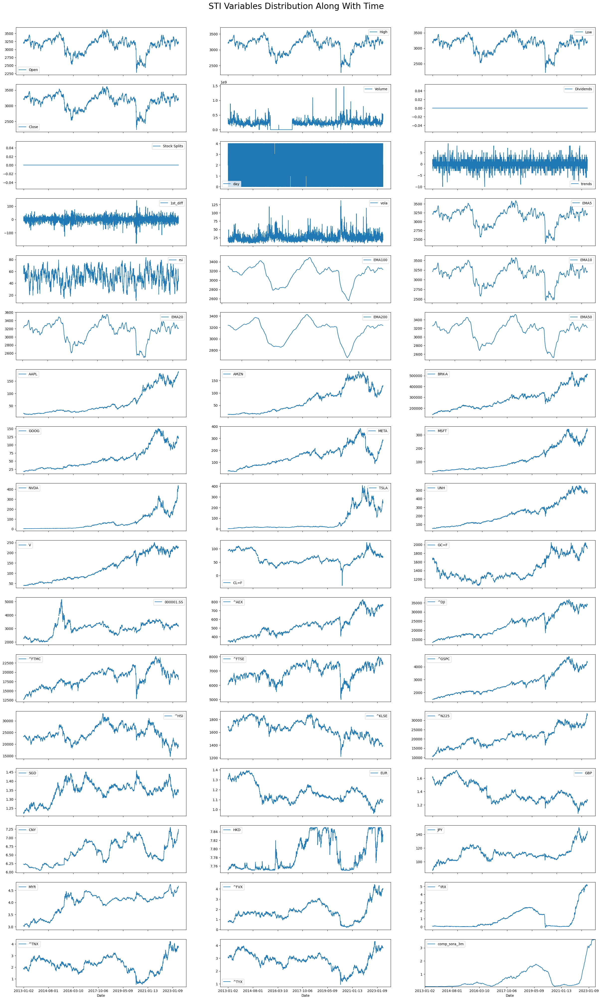

In [57]:
# plot all columns against time index
fig, axes = plt.subplots(nrows=17,ncols=3, figsize = (30,50))
fig.suptitle('STI Variables Distribution Along With Time', fontsize=24, y=0.9)
for ax, col in zip(axes.ravel(), STI.columns):
    STI[col].plot(legend=True,sharex=True,ax=ax)
plt.autoscale(tight=True)
plt.show()

# save the above figure
fig.savefig('images/STI_variable_timeline_distribution.png',dpi='figure',
            facecolor='white')


There are sharp falls in many features in the year 2020 which could be the impact of the Covid19 by the end of 2019.

### Data cleaning


#### Removing columns contain no information

From above, we can see that variables are with different range, patterns along with the time. Additionaly, the "Dividends" and "Stock Splits" are zero values which does not provide any useful information. Hence, they can be removed.

In [58]:
STI.drop(["Dividends" , "Stock Splits"], axis=1, inplace=True)

### Compute missing values

In [59]:
pd.set_option('display.max_rows', None)
print('Missing values in each variable:\n', STI.isna().sum())

Missing values in each variable:
 Open              0
High              0
Low               0
Close             0
Volume            0
day               0
trends            0
1st_diff          1
vola              0
EMA5              5
rsi              17
EMA100          124
EMA10            11
EMA20            23
EMA200          249
EMA50            61
AAPL             69
AMZN             69
BRK-A            69
GOOG             69
META             69
MSFT             69
NVDA             69
TSLA             69
UNH              69
V                69
CL=F             72
GC=F             73
000001.SS       189
^AEX             19
^DJI             69
^FTMC            54
^FTSE            55
^GSPC            69
^HSI            109
^KLSE           104
^N225           186
SGD              22
EUR              22
GBP              22
CNY              22
HKD              22
JPY              22
MYR              22
^FVX             72
^IRX             72
^TNX             72
^TYX             72
comp_s

#### Missing values produced by calculation

The moving averaging calculation will generate N.A. values in the beginning data points. The missing values in variables ('1st_diff', 'EMA5', 'EMA10', 'EMA20', 'EMA50', 'EMA100', 'EMA200' and 'rsi') are produced by math calculation from STI daily close price. We can exclude these N.A. values. The first 200 data points of EMA200 will be missing values. 

In [60]:
# check missing value in primitive variables and technical indicators
STI.iloc[:200, 7:16].sample(5)

,1st_diff,vola,EMA5,rsi,EMA100,EMA10,EMA20,EMA200,EMA50
Date,,,,,,,,,
2013-04-25,15.000000,28.320068,3314.971328,61.864372,NaN,3306.760653,3300.256327,NaN,3285.031613
2013-03-21,19.250000,25.679932,3266.224577,48.798188,NaN,3271.451854,3273.640255,NaN,3259.910902
2013-02-19,7.630127,18.290039,3288.930947,61.825808,NaN,3283.333678,3268.603021,NaN,NaN
2013-03-01,-0.449951,14.399902,3270.995572,50.720935,NaN,3275.363585,3272.519961,NaN,NaN
2013-06-03,-20.290039,24.530029,3333.945894,32.112311,3302.893073,3364.494623,3378.480441,NaN,3354.609190


In [61]:
# 'EMA200' has the highest number of rows with N.A. values. 
STI = STI[STI['EMA200'].notna()]

#### Missing values from original scraped datasets

By manually checking other variables, we found that the missing values are caused by public holidays and business closure days in different markets. Hence, we will populate these missing values by the forward fill method, as time series data is autoregressive. 

In [62]:
# sample missing values from other variables
# re-run this code to sample variables randomly containing missing values 
STI.iloc[:,16:-1][STI.isna().any(axis=1)].sample(5).T

Date,2020-01-31,2019-01-02,2021-12-24,2023-05-05,2013-12-31
AAPL,77.377502,39.480000,NaN,173.570007,20.036428
AMZN,100.435997,76.956497,NaN,105.660004,19.939501
BRK-A,335996.000000,304057.000000,NaN,491840.000000,177900.000000
GOOG,71.711502,52.292500,NaN,106.214996,27.913124
META,201.910004,135.679993,NaN,232.779999,54.650002
MSFT,170.229996,101.120003,NaN,310.649994,37.410000
NVDA,59.107498,34.055000,NaN,286.799988,4.005000
TSLA,43.371334,20.674667,NaN,170.059998,10.028667
UNH,272.450012,243.490005,NaN,494.279999,75.300003
V,198.970001,132.919998,NaN,231.779999,55.669998


In [63]:
# compute the N.A. values
for col in STI.columns:
    STI[col]=STI[col].fillna(method='ffill')

In [64]:
# Check missing values
pd.set_option('display.max_rows', None)
STI.isna().sum()

Open            0
High            0
Low             0
Close           0
Volume          0
day             0
trends          0
1st_diff        0
vola            0
EMA5            0
rsi             0
EMA100          0
EMA10           0
EMA20           0
EMA200          0
EMA50           0
AAPL            0
AMZN            0
BRK-A           0
GOOG            0
META            0
MSFT            0
NVDA            0
TSLA            0
UNH             0
V               0
CL=F            0
GC=F            0
000001.SS       0
^AEX            0
^DJI            0
^FTMC           0
^FTSE           0
^GSPC           0
^HSI            0
^KLSE           0
^N225           0
SGD             0
EUR             0
GBP             0
CNY             0
HKD             0
JPY             0
MYR             0
^FVX            0
^IRX            0
^TNX            0
^TYX            0
comp_sora_3m    0
dtype: int64

### Save cleaned data

In [65]:
STI.to_csv("STI_cleaned.csv")

### Basic information

In [66]:
# Read data
sti_EDA = pd.read_csv("STI_cleaned.csv", index_col="Date")

In [67]:
sti_EDA.head()

,Open,High,Low,Close,Volume,day,trends,1st_diff,vola,EMA5,...,GBP,CNY,HKD,JPY,MYR,^FVX,^IRX,^TNX,^TYX,comp_sora_3m
Date,,,,,,,,,,,,,,,,,,,,,
2013-10-18,3201.469971,3203.090088,3188.590088,3192.899902,205491000,4,3.0,6.279785,14.500000,3180.414598,...,1.6168,6.0968,7.7540,97.73,3.1585,1.337,0.025,2.589,3.654,0.0529
2013-10-18,3201.469971,3203.090088,3188.590088,3192.899902,205491000,4,3.0,6.279785,14.500000,3180.414598,...,1.6168,6.0968,7.7540,97.73,3.1585,1.337,0.025,2.589,3.654,0.0529
2013-10-21,3206.010010,3208.870117,3193.290039,3195.760010,274733300,0,4.0,2.860107,15.580078,3185.529735,...,1.6147,6.0926,7.7523,98.19,3.1685,1.357,0.025,2.609,3.681,0.0527
2013-10-22,3202.870117,3214.239990,3199.399902,3210.209961,282212600,1,5.0,14.449951,14.840088,3193.756477,...,1.6235,6.0927,7.7526,98.14,3.1745,1.283,0.033,2.512,3.609,0.0527
2013-10-23,3220.949951,3235.250000,3198.959961,3204.800049,304245900,2,-1.0,-5.409912,36.290039,3197.437668,...,1.6164,6.0835,7.7533,97.38,3.1645,1.273,0.030,2.485,3.582,0.0525


In [68]:
sti_EDA.tail()

,Open,High,Low,Close,Volume,day,trends,1st_diff,vola,EMA5,...,GBP,CNY,HKD,JPY,MYR,^FVX,^IRX,^TNX,^TYX,comp_sora_3m
Date,,,,,,,,,,,,,,,,,,,,,
2023-06-22,3222.860107,3228.350098,3211.179932,3222.429932,274868600,3,-1.0,-1.229980,17.170166,3225.518928,...,1.2746,7.1796,7.8304,143.11,4.648,4.046,5.135,3.799,3.872,3.6346
2023-06-23,3219.189941,3222.790039,3187.820068,3191.600098,511366000,4,-2.0,-30.829834,34.969971,3214.212651,...,1.2711,7.1799,7.8298,143.68,4.674,3.995,5.138,3.739,3.821,3.6352
2023-06-26,3195.979980,3217.610107,3188.229980,3189.679932,345771100,0,-3.0,-1.920166,29.380127,3206.035078,...,1.2712,7.2364,7.8301,143.50,4.670,3.963,5.155,3.719,3.819,3.6371
2023-06-27,3198.330078,3213.219971,3195.969971,3205.350098,522355000,1,1.0,15.670166,17.250000,3205.806751,...,1.2746,7.2193,7.8334,144.07,4.662,4.034,5.180,3.768,3.840,3.6396
2023-06-28,3217.909912,3223.110107,3201.659912,3207.280029,441381100,2,2.0,1.929932,21.450195,3206.297844,...,1.2640,7.2436,7.8325,144.46,4.669,3.972,5.170,3.710,3.803,3.6414


In [69]:
sti_EDA.info()

<class 'pandas.core.frame.DataFrame'>
Index: 2869 entries, 2013-10-18 to 2023-06-28
Data columns (total 49 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Open          2869 non-null   float64
 1   High          2869 non-null   float64
 2   Low           2869 non-null   float64
 3   Close         2869 non-null   float64
 4   Volume        2869 non-null   int64  
 5   day           2869 non-null   int64  
 6   trends        2869 non-null   float64
 7   1st_diff      2869 non-null   float64
 8   vola          2869 non-null   float64
 9   EMA5          2869 non-null   float64
 10  rsi           2869 non-null   float64
 11  EMA100        2869 non-null   float64
 12  EMA10         2869 non-null   float64
 13  EMA20         2869 non-null   float64
 14  EMA200        2869 non-null   float64
 15  EMA50         2869 non-null   float64
 16  AAPL          2869 non-null   float64
 17  AMZN          2869 non-null   float64
 18  BRK-A         2869

In [70]:
sti_EDA.describe().T

,count,mean,std,min,25%,50%,75%,max
Open,2869.0,3.129809e+03,2.463232e+02,2274.379883,3.004350e+03,3.193290e+03,3.288560e+03,3.624200e+03
High,2869.0,3.142394e+03,2.446521e+02,2274.379883,3.020520e+03,3.204520e+03,3.298440e+03,3.641650e+03
Low,2869.0,3.116291e+03,2.480536e+02,2208.419922,2.994750e+03,3.180400e+03,3.277020e+03,3.607250e+03
Close,2869.0,3.129272e+03,2.464088e+02,2233.479980,3.011080e+03,3.191160e+03,3.288950e+03,3.615280e+03
Volume,2869.0,2.104029e+08,1.327389e+08,0.000000,1.637972e+08,2.139835e+08,2.735406e+08,1.472752e+09
day,2869.0,2.256187e+00,1.465872e+00,0.000000,1.000000e+00,2.000000e+00,4.000000e+00,4.000000e+00
trends,2869.0,5.925410e-03,2.432413e+00,-10.000000,-2.000000e+00,-1.000000e+00,2.000000e+00,9.000000e+00
1st_diff,2869.0,-2.150633e-03,2.454265e+01,-182.869873,-1.267017e+01,-1.000977e-02,1.380005e+01,1.434199e+02
vola,2869.0,2.610266e+01,1.304630e+01,6.969971,1.764990e+01,2.308984e+01,3.077002e+01,1.372002e+02
EMA5,2869.0,3.129268e+03,2.447989e+02,2374.984472,3.009957e+03,3.191673e+03,3.287757e+03,3.595599e+03


In [71]:
# check all of N.A. values in the combined data
print('Total missing values in the dataset:',sti_EDA.isna().sum().sum())

Total missing values in the dataset: 0


In [72]:
print('Total number of variables in the dataset:', len(sti_EDA.columns))

Total number of variables in the dataset: 49


### Plots

#### A look of each variable along with time

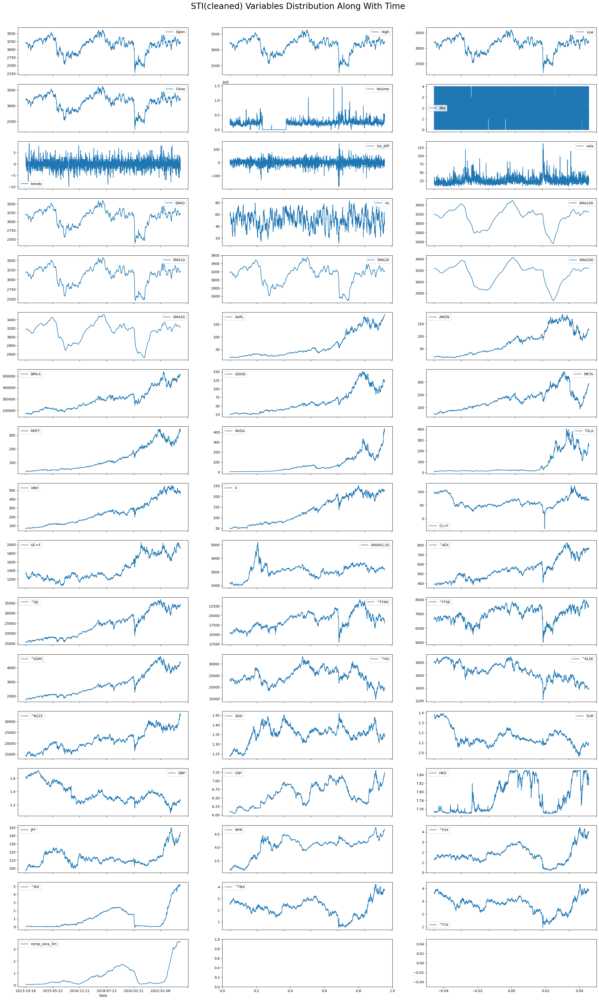

In [73]:
# https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.plot.html
fig, axes = plt.subplots(nrows=17,ncols=3, figsize = (30,50))
fig.suptitle('STI(cleaned) Variables Distribution Along With Time', fontsize=24, y=0.9)
for ax, col in zip(axes.ravel(), STI.columns):
    STI[col].plot(legend=True,sharex=True,ax=ax)
plt.autoscale(tight=True)
plt.show()

# save the above figure
fig.savefig('images/STI_cleaned_variable_timeline_distribution.png',dpi='figure',
            facecolor='white')

The price pattern in STI is complicated. There are two major drops in the curve near year 2016 and 2020 in daily prices. The trading volume in the year 2016 presents almost a flat line on the lower side while having some sharp hypes in the years of 2018, 2020, and 2022. The volatility shows a big exaggeration at the beginning of the year 2020. 

U.S. big companies' stock prices and the market indices show an uptrend in the first few years while the trend breaks with a deep drop at the beginning of 2022. Starting from the year 2022, most variables fluctuate more fiercely. The indices performed differently in different markets. Currency exchange rate to U.S. dollars and commodities are complicated and the patterns are hard to visualize. There is a drop at the beginning of the year 2022 and a rise starting from 2022 for treasury bonds and interest rates.

#### Moving averages and STI 'Close' price curves

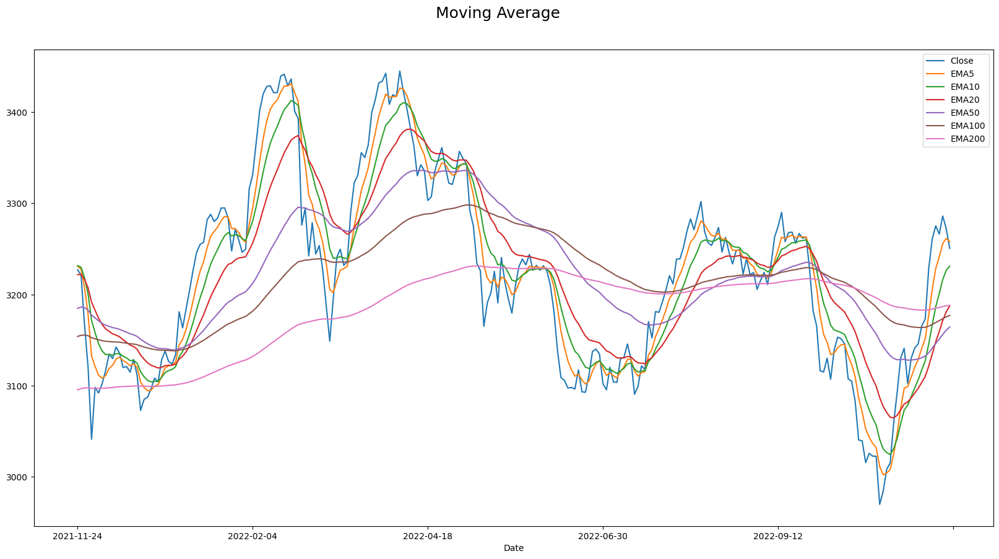

In [74]:
# Moving average curves against STI daily close price
# visualize by zooming in last 200 records
fig,ax= plt.subplots(nrows=1,ncols=1, figsize=(20,10))
fig.suptitle("Moving Average", fontsize=18, y=0.95)
sti_EDA[['Close', 'EMA5', 'EMA10', 'EMA20', 'EMA50',
         'EMA100', 'EMA200']][-400:-150].plot(ax=ax)

fig.savefig('images/moving_average.png',dpi='figure', facecolor='white')

The moving average could provide information on future prices. The buying and selling signals could be captured by comparing the "Close" price with moving average values. The crossing of different moving average values could form types of trading patterns. For example,  a death cross which occurs when the 50-day SMA crosses below the 200-day SMA suggests a bearish signal(Chen, 2023)


#### Other variables and STI 'Close' price comparison plots
"Other variables" refers to variables excluding primitive variables and technical indicators

In [75]:
# group all of the variables together
groups = {'prim_V':['Open', 'High', 'Low', 'Close', 'Volume', 'day', 'trends',
                    '1st_diff', 'vola'],
          'TI_V':['EMA20', 'rsi', 'EMA50', 'EMA5', 'EMA200', 'EMA10', 'EMA100'],
          'US_V': ['AAPL', 'MSFT','GOOG', 'AMZN','NVDA','TSLA', 'META',
                   'BRK-A', 'V', 'UNH'] ,
          'Commodities_V': ['CL=F', 'GC=F'],
          'indices_V':['^GSPC', '^DJI', '^FTSE', '^FTMC', '^HSI', '000001.SS',
                       '^AEX', '^KLSE', '^N225'],
          'currencies_V':['SGD','EUR','GBP','CNY','HKD','JPY','MYR'],
          'TB_V':['^IRX', '^FVX', '^TNX', '^TYX'],
          'ir_V': ['comp_sora_3m']
         }

# To visualize different variable trends in the same scale
scaled_STI = pd.DataFrame(minmax_scale(sti_EDA), 
                               columns=sti_EDA.columns, 
                               index=sti_EDA.index
                              )

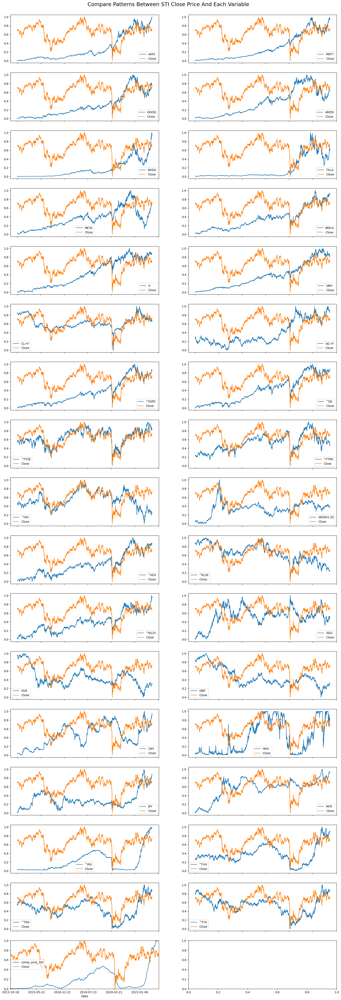

In [76]:
# variables to visualize
var=[]
for g in list(groups.keys())[2:]:
    var.extend(groups[g])

# visualize variables comparing with 'Close' price
fig, axes = plt.subplots(nrows=math.ceil(len(var)/2), ncols=2, figsize=(20,60))

# set figure title
fig.suptitle('Compare Patterns Between STI Close Price And Each Variable',
             fontsize=18, y=0.89)

for ax, v in zip(axes.ravel(),var):
    scaled_STI[[v, 'Close']].plot(ax=ax, sharex=True)
    fig.add_axes(ax)

plt.autoscale(tight=True)
plt.show()

# save the above figure
fig.savefig('images/compare_patterns_between_each_var_and_Close_price.png',
            facecolor='white',pad_inches=0)

It is difficult to discover the relationship between most variables and STI stock prices with the naked eye for persons without any financial background. Comparing all these plots, there are more similarities between the STI close price curve and indices '^FTSE'

### Check stationary 


In [77]:
# run adfuller test for unit root:
adf_p={}
for col in sti_EDA.columns:
    result=adfuller(sti_EDA[col])
    adf_p[col]=result[1]


In [78]:
# generate data frame from adfuller test result
stats_=pd.DataFrame.from_dict(adf_p, orient='index', columns=['p_value'])

In [79]:
stats_['stationary']=stats_['p_value'].apply(lambda x: True if (x<0.05) else False)

In [80]:
# variables that have passed ADfuller test
stats_[stats_['stationary']].index.values

print("number of variables that are stationary:", 
      len(stats_[stats_['stationary']].index.values))
print("variables that are stationary:", 
      stats_[stats_['stationary']].index.values)    

number of variables that are stationary: 8
variables that are stationary: ['Low' 'Volume' 'day' 'trends' '1st_diff' 'vola' 'rsi' 'SGD']


In [81]:
# variables that are non-stationary
non_stat_v =list(set(sti_EDA.columns)- set(stats_[stats_['stationary']].index))

# eliminate the 'Close' price as it's already differenced to variable '1st_diff' 
non_stat_v.remove('Close')

# number of variables that are non-stationary
print('Variables to be differenced: ',non_stat_v, 
      '\nNumber of variables: ', len(non_stat_v))

Variables to be differenced:  ['EMA5', 'MYR', 'AAPL', '000001.SS', 'CNY', '^FVX', '^AEX', 'TSLA', 'GOOG', 'EUR', 'Open', 'META', '^TYX', 'GC=F', '^TNX', 'JPY', '^KLSE', 'EMA200', 'GBP', 'comp_sora_3m', '^DJI', 'EMA100', '^GSPC', 'UNH', '^N225', 'High', 'AMZN', 'MSFT', 'NVDA', 'EMA10', 'HKD', '^FTSE', '^HSI', 'EMA20', 'V', 'BRK-A', '^IRX', '^FTMC', 'CL=F', 'EMA50'] 
Number of variables:  40


### Statistic analysis 

In [82]:
# take the 1st difference for the non-stationary variables
sti_EDA[non_stat_v]=sti_EDA[non_stat_v].diff()
# generate new data for the differenced data
sti_EDA_diff=sti_EDA[non_stat_v].add_suffix('_1diff')

In [83]:
# variables that passed the stationary test
var_sts = stats_[stats_['stationary']].index.values
sti_EDA_diff[var_sts]=sti_EDA[var_sts]

In [84]:
# drop the N.A. value created by calculating 1st difference
sti_EDA_diff.dropna(inplace=True)

In [85]:
# check the stationary for the updated data
adf_p_={}
for col in sti_EDA_diff.columns:
    result=adfuller(sti_EDA_diff[col])
    adf_p_[col]=result[1]

In [86]:
stats_new=pd.DataFrame.from_dict(adf_p_, orient='index', columns=['p_value'])
stats_new['stationary']=stats_new['p_value'].apply(
    lambda x: True if (x<0.05) else False)

In [87]:
stats_new[stats_new['stationary']].index

Index(['EMA5_1diff', 'MYR_1diff', 'AAPL_1diff', '000001.SS_1diff', 'CNY_1diff',
       '^FVX_1diff', '^AEX_1diff', 'TSLA_1diff', 'GOOG_1diff', 'EUR_1diff',
       'Open_1diff', 'META_1diff', '^TYX_1diff', 'GC=F_1diff', '^TNX_1diff',
       'JPY_1diff', '^KLSE_1diff', 'EMA200_1diff', 'GBP_1diff',
       'comp_sora_3m_1diff', '^DJI_1diff', 'EMA100_1diff', '^GSPC_1diff',
       'UNH_1diff', '^N225_1diff', 'High_1diff', 'AMZN_1diff', 'MSFT_1diff',
       'NVDA_1diff', 'EMA10_1diff', 'HKD_1diff', '^FTSE_1diff', '^HSI_1diff',
       'EMA20_1diff', 'V_1diff', 'BRK-A_1diff', '^IRX_1diff', '^FTMC_1diff',
       'CL=F_1diff', 'EMA50_1diff', 'Low', 'Volume', 'day', 'trends',
       '1st_diff', 'vola', 'rsi', 'SGD'],
      dtype='object')

In [88]:
if set(stats_new[stats_new['stationary']].index) == set(sti_EDA_diff.columns):
    print("All variables are stationary")

All variables are stationary


### Statistical data distributions

In [89]:
# we want to plot the same group of variables together
cols= ['1st_diff', 'Open_1diff','High_1diff',  'Low', 'Volume', 'day', 'trends','vola',
       'EMA5_1diff', 'EMA10_1diff', 'EMA20_1diff', 'EMA50_1diff','EMA100_1diff',
       'EMA200_1diff', 'rsi', 
       'AAPL_1diff', 'MSFT_1diff','META_1diff','UNH_1diff','NVDA_1diff',
       'AMZN_1diff','GOOG_1diff','TSLA_1diff','BRK-A_1diff','V_1diff', 
       'CL=F_1diff','GC=F_1diff', 
       '^GSPC_1diff','^DJI_1diff','^FTSE_1diff','^FTMC_1diff','^FVX_1diff',
       '^HSI_1diff','000001.SS_1diff', '^AEX_1diff','^KLSE_1diff','^N225_1diff',
       'SGD','EUR_1diff', 'GBP_1diff',  'HKD_1diff', 'JPY_1diff', 'MYR_1diff',
       'CNY_1diff',
       '^IRX_1diff', '^TYX_1diff', '^TNX_1diff', 'comp_sora_3m_1diff', ]

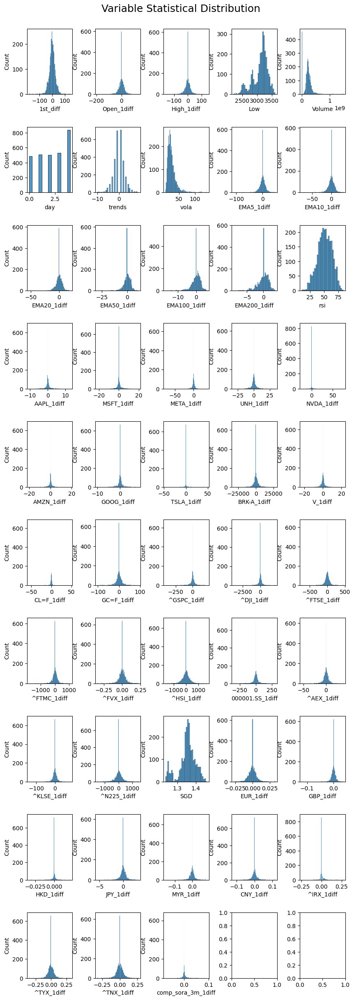

In [90]:
fig, axes=plt.subplots(nrows=10, ncols=5, figsize=(10,30))
plt.subplots_adjust(hspace=0.5, wspace=0.5)
fig.suptitle("Variable Statistical Distribution", fontsize=18, y=0.9)

# plot histogram of each variable
for ax, col in zip(axes.ravel(), cols):
    # plot each variable
    sns.histplot(sti_EDA_diff[col], ax=ax)

fig.savefig('images/fig8_Variable statistical distribution.png',
            dpi='figure', facecolor='white')

Most of the variables are symmetric, and the 1st difference is at mean zero with small variance(indicating variance) and high peak(indicating concentrative returns value). "trends" is symmetric, most days the price increase or decrease for 1 or 2 consecutive days. A few times, the price can increase or decrease continuously for about 10 days. Volume is roughly symmetric, but there is an outlier in which time the volume is stagnant at a very low value. Volatility is skewed with a long right tail showing that at a few points in time, there are catastrophic changes in the price. 

### Correlations

##### Correlations with the first difference value of STI Close price

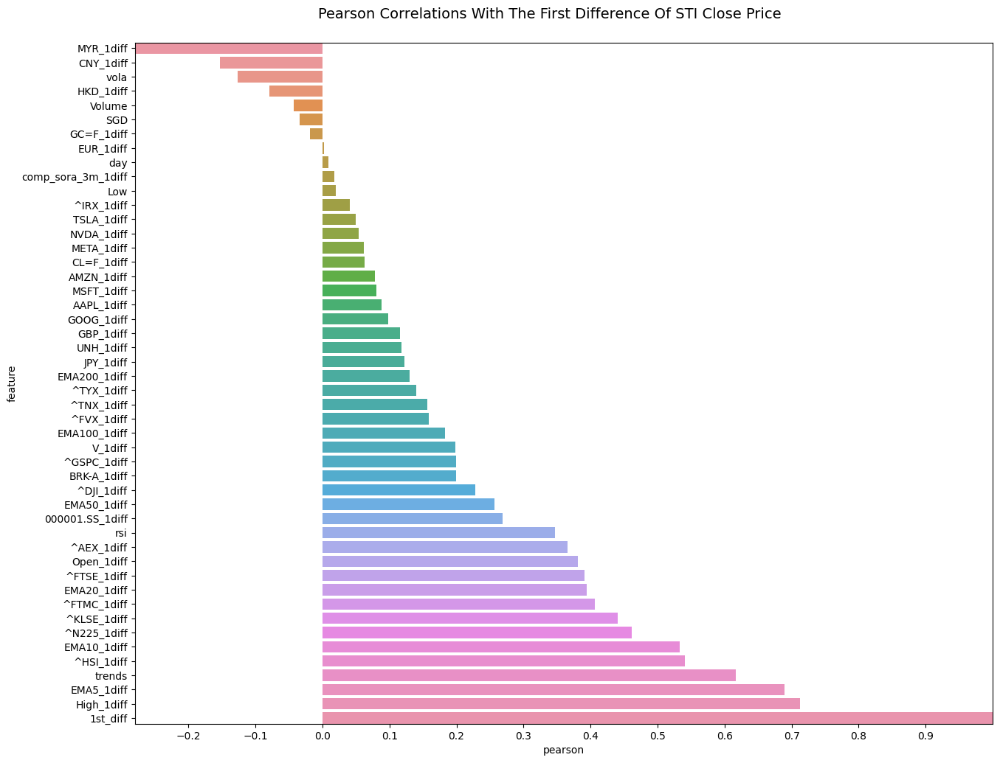

In [91]:
pearson(sti_EDA_diff)

##### Pairwise correlations of all variables

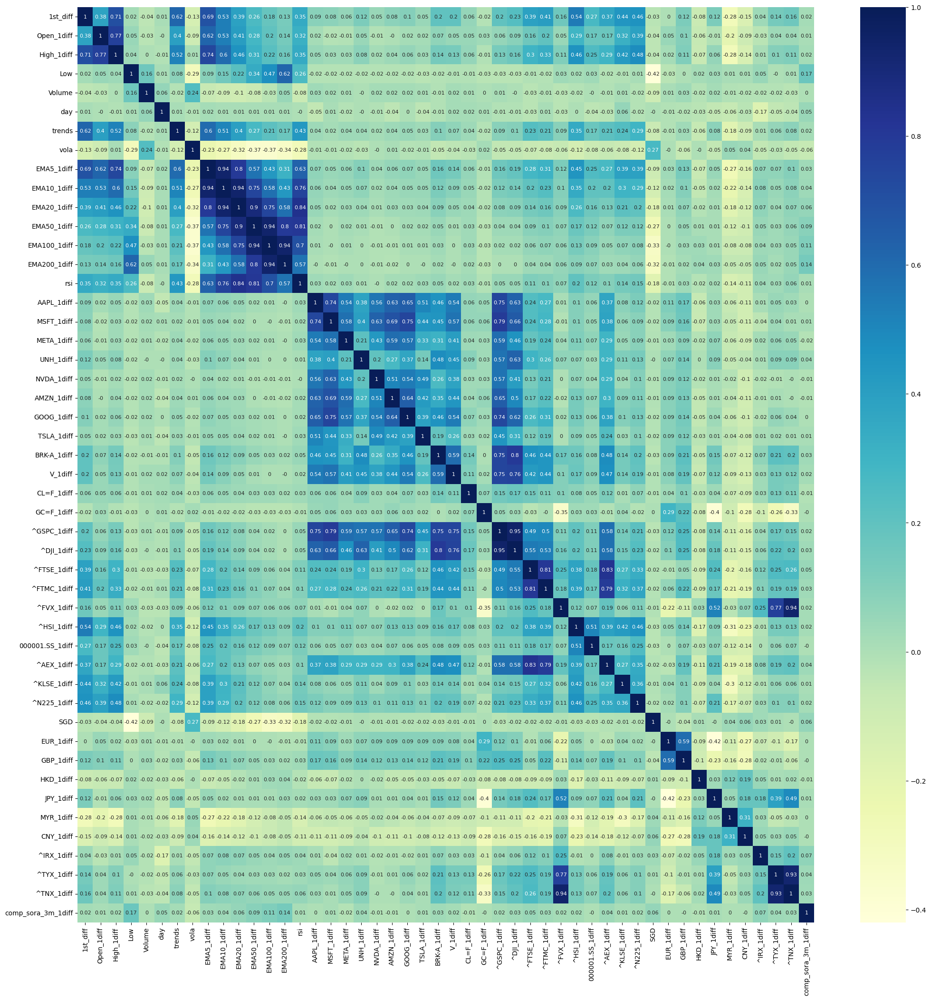

In [92]:
# plot correlations of all variables
fig, ax=plt.subplots(figsize=(25,25))
corr = sti_EDA_diff[cols].corr(method='pearson').round(2)
sns.heatmap(corr,annot=True, cmap="YlGnBu",annot_kws={"fontsize":8},
            vmin=corr.values.min(),ax=ax)
plt.show()
fig.suptitle("Pairwise Pearson Correlations", fontsize=18, y=0.9)
fig.savefig('images/pairwise_correlations.png',
            dpi='figure', facecolor='white')

Generally, higher correlation could be seen among variables inside each group of variables (including groups of U.S. companies stock prices, difference market indices prices, currencies exchange rates, and treasury bonds prices). Commodities prices seem to have weak correlations with all other variables.

### ACP & PACF
the STI daily close price could be affected by many factors, such as economic factors. Due to the autocorrelation of time series data, we need to look into how past price could impact the current day's price. As STI daily close price is non-stationary, we take the first difference value in our analysis. 

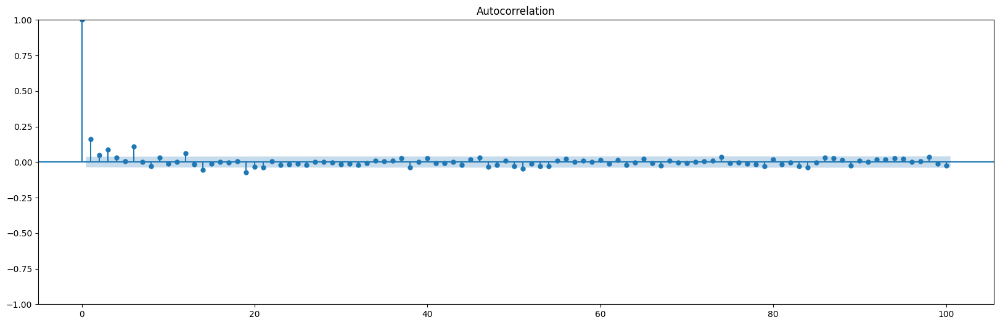

In [93]:
# https://www.youtube.com/watch?v=y8opUEd05Dg&list=
# PLvcbYUQ5t0UHOLnBzl46_Q6QKtFgfMGc3&index=3
fig, ax = plt.subplots(figsize=(20,6))
# autocorrelation
#lags represent about half a year effect
acf_plot = plot_acf(sti_EDA_diff['1st_diff'], lags=100, ax=ax) 

# save the above figure
fig.savefig('images/Autocorrelation.png',dpi='figure', facecolor='white')

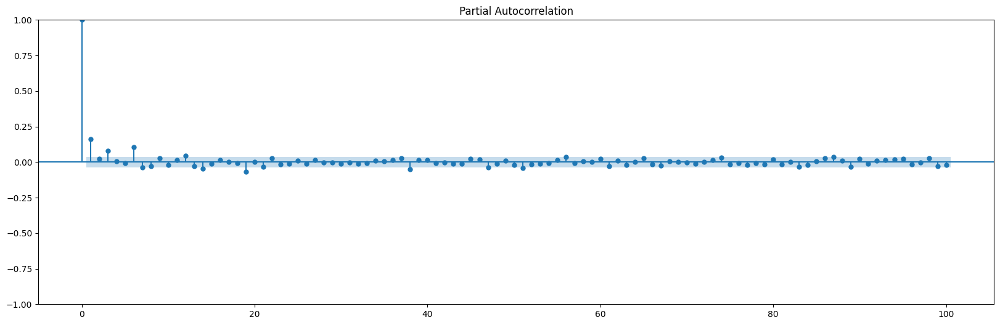

In [94]:
fig, ax = plt.subplots(figsize=(20,6))
# partial autocorrelation
pacf_plot = plot_pacf(sti_EDA_diff['1st_diff'], lags=100, ax=ax)

# save the above figure
fig.savefig('images/Partial Autocorrelation.png',dpi='figure', facecolor='white')

From ACF and PACF, the first difference of Close price has obvious correlations in previous sequence of day 1, 3, and 6. Some less obvious could be seen around day 20, and 40. To enable our models to see more previous information, we will use a look back window size based 40 days. 

### Predictability of STI by Hurst Exponent


In [95]:
H1, c, val = compute_Hc(
    STI['Close'][:'2015-1-1'], 
    kind='random_walk', 
    simplified=True
    )
print('Hurst Exponent before 2015:', H1)

Hurst Exponent before 2015: 0.562748551061561


In [96]:
H2, c, val = compute_Hc(
    STI['Close']['2015-01-01':'2017-1-1'], 
    kind='random_walk', 
    simplified=True
    )
print('Hurst Exponent 2015~2017:', H2)

Hurst Exponent 2015~2017: 0.5719537203269689


In [97]:
H3, c, val = compute_Hc(
    STI['Close']['2017-01-01':'2019-1-1'], 
    kind='random_walk', 
    simplified=True
    )
print('Hurst Exponent 2017~2019:', H3)

Hurst Exponent 2017~2019: 0.5232751754399704


In [98]:
H4, c, val = compute_Hc(
    STI['Close']['2019-01-01':'2021-1-1'], 
    kind='random_walk', 
    simplified=True
    )
print('Hurst Exponent 2019~2021:', H4)

Hurst Exponent 2019~2021: 0.5372775946728126


In [99]:
H5, c, val = compute_Hc(
    STI['Close']['2021-01-01':'2023-1-1'], 
    kind='random_walk', 
    simplified=True
    )
print('Hurst Exponent 2021~2023:', H5)

Hurst Exponent 2021~2023: 0.4468358553163923


## Data preparation


### Train, test datasets splitting and convert to scaled tensors
We will test models using data in 2023. Dataset will be split into two: dataset for testing and for training. The training dataset will be further split into multiple training and validation subsets. 

In [100]:
# read in dataset
STI = pd.read_csv("STI_cleaned.csv", index_col="Date")

# define test dataset
# 1st of Jan is public holiday
test_df = STI['2023-01-02':]
print(test_df.shape)

# define training dataset
train_val = STI[:-len(test_df)]
print(train_val.shape)

features = train_val.shape[-1]
print('Number of features: ', features)

# define lookback period
window=40
print('window:', window)

# define batch_size
batch_size = 128
print('batch_size:', batch_size)

(122, 49)
(2747, 49)
Number of features:  49
window: 40
batch_size: 128


In [101]:
# Normalize data and split it into train, and test datasets. 
# Further split the training dataset into i-fold sub-datasets
scaler = MinMaxScaler()
scaler.fit(train_val)
    
# the min, max value of STI daily close price
target_min = scaler.data_min_[3]
target_max = scaler.data_max_[3]
    
# scale test_df and train_val data sets
test_df = scaler.transform(test_df)
train_val = scaler.transform(train_val)
    
#convert test dataset to 3D tensor (minbatch, timestep, features)
    
# convert the test dataset into tensor
test_dataset = keras.utils.timeseries_dataset_from_array(
                    test_df[:-window],
                    targets = test_df[:,3][window:], # target is the STI daily Close price
                    sequence_length = window,
                    shuffle = False,
                    batch_size = batch_size,
                    )
    
# convert the train_val dataset into tensor 
train_val_tensor = keras.utils.timeseries_dataset_from_array(
                        train_val[:-window],
                        targets = train_val[:,3][window:], # target is the STI daily Close price
                        sequence_length = window,
                        shuffle = False,
                        batch_size = batch_size,
                        )
# The scaled STI daily close price in test dataset
Close_scaled=[]
for _, target in test_dataset:
    Close_scaled.extend(target.numpy())

# The original scale STI daily close price
Close = np.array(Close_scaled)*(target_max-target_min)+target_min
print('The STI daily Close price to be predicted:\n', Close, '\nNumber of values:', len(Close))

The STI daily Close price to be predicted:
 [3234.89990234 3232.02001953 3239.31005859 3245.27001953 3226.86010742
 3214.51000977 3177.42993164 3132.37011719 3129.75       3172.91992188
 3155.54003906 3183.2800293  3139.76000977 3173.92993164 3220.97998047
 3219.         3212.63989258 3239.0300293  3255.54003906 3262.54003906
 3257.17993164 3258.89990234 3281.08007812 3311.12011719 3318.87011719
 3300.47998047 3294.42993164 3297.83007812 3286.12011719 3294.54003906
 3302.65991211 3319.26000977 3309.56005859 3324.05004883 3313.40991211
 3321.82006836 3324.55004883 3296.56005859 3293.90991211 3282.0300293
 3270.51000977 3281.98999023 3262.01000977] 
Number of values: 43


In [102]:
for f, t in test_dataset: 
    print(f.shape)

(43, 40, 49)


### Split training dataset further into folds of training and validation sub-datasets


In [103]:
# split dataset with the 1st fold training data numbers, validation dataset numbers, step length, and gap length.
tscv = expanding_window(n_train=500, n_val=250,step=250, gap=60)
train_val_ifold = tscv.gen_data_ifold(train_val, target=train_val[:,3], 
                                      window=window, batch_size=batch_size)

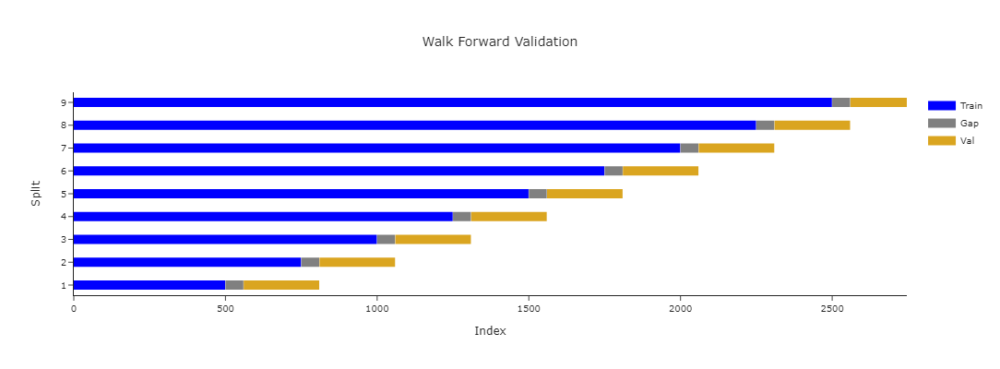

In [104]:
# visualize the subsets of data split 
plot_cross_val(splitter_func=tscv,
                df=train_val,
                title_text='Walk Forward Validation')


## Modelling

### Baseline models-ANN



#### Simple ANN

In [105]:
# define model architecture

inputs = layers.Input(shape=(window, train_val.shape[-1]))
tensor = layers.Flatten()(inputs)
tensor = layers.Dense(2, activation = "relu")(tensor)
outputs = layers.Dense(1)(tensor)
simple_ann = keras.Model(inputs, outputs)

# save best performed model during training
callbacks = [
    keras.callbacks.ModelCheckpoint("STI_ann.keras", save_best_only = True)
]

# define model optimisation algorithm
simple_ann.compile(optimizer = "adam", loss = "mse", metrics = ["mape", "mae"])


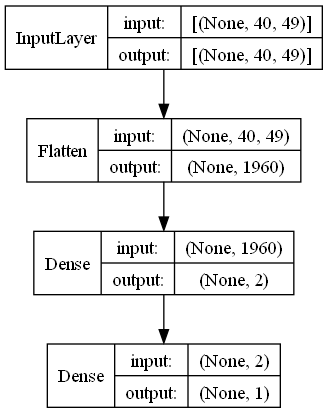

In [106]:
# visualize model structure
plot_model(simple_ann, to_file='images/simple_ann.png',
           show_shapes=True, show_layer_names=False)


In [107]:
# train the model using one slice of data
t = train_val_ifold[-2][0]
v = train_val_ifold[-2][1]

history_simple_ann = simple_ann.fit(
                t,
                epochs = 50,
                validation_data =v,
                callbacks = callbacks
                )

Epoch 1/50
17/17 [==============================] - 1s 18ms/step - loss: 0.1001 - mape: 239128.4219 - mae: 0.2541 - val_loss: 0.0090 - val_mape: 11.5551 - val_mae: 0.0774
Epoch 2/50
17/17 [==============================] - 0s 10ms/step - loss: 0.0278 - mape: 255286.7188 - mae: 0.1312 - val_loss: 0.0097 - val_mape: 12.2545 - val_mae: 0.0812
Epoch 3/50
17/17 [==============================] - 0s 9ms/step - loss: 0.0159 - mape: 197162.2812 - mae: 0.0993 - val_loss: 0.0167 - val_mape: 15.8960 - val_mae: 0.1068
Epoch 4/50
17/17 [==============================] - 0s 9ms/step - loss: 0.0090 - mape: 133138.4844 - mae: 0.0746 - val_loss: 0.0175 - val_mape: 16.4419 - val_mae: 0.1105
Epoch 5/50
17/17 [==============================] - 0s 10ms/step - loss: 0.0070 - mape: 130173.9062 - mae: 0.0660 - val_loss: 0.0121 - val_mape: 13.2634 - val_mae: 0.0891
Epoch 6/50
17/17 [==============================] - 0s 9ms/step - loss: 0.0062 - mape: 101583.1094 - mae: 0.0620 - val_loss: 0.0097 - val_mape: 11.

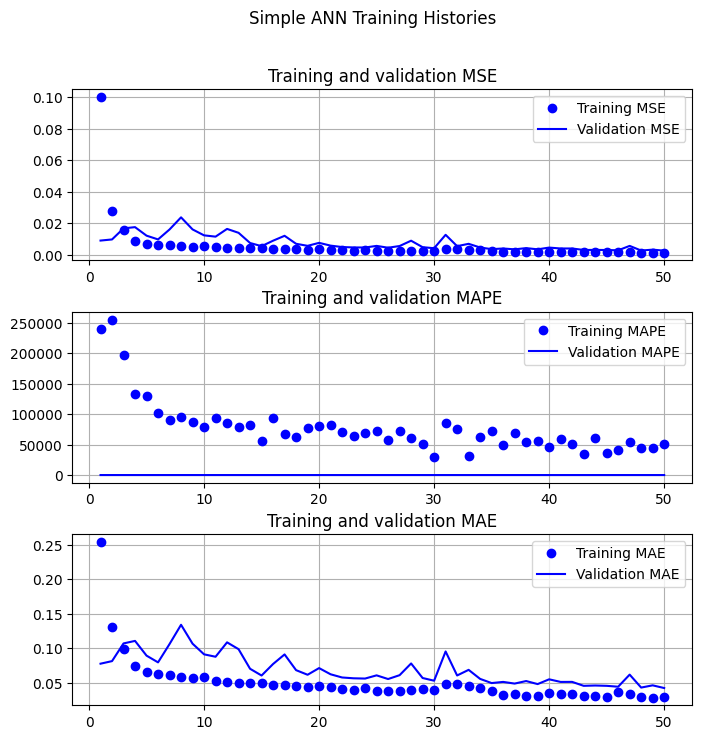

In [108]:
# plot model performance during training
fig=plot_history(history_simple_ann, title='Simple ANN Training Histories')
fig.savefig('images/simple_ANN_histories.png',dpi='figure')

The improvement of the performance slows down around 10 epochs of the simple_ann model. We can estimate our hyperparameter space with a few layers, a small number of neurons, and a few epochs.

#### Hyperparameter tunning for optimised ANN

##### Build hyper ANN model

In [109]:
# define hypermodel 
def hyp_ann(hp): 
    """
    Builds ANN models based on instances of HyperParameters object 
    from pre-defined hyperparameter space.
    
    Parameters
    ----------
    hp : HyperParameter object
    
    Returns
    -------
    model : keras model
            neuron network models built on HyperParameter object instances. 
    """
    
    # Dense layers features
    Layers = hp.Int("layers", min_value = 1, max_value = 10, step = 1)
    dropout = hp.Choice('dropout',[0.0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7]) 
               
    # model structures
    inputs=layers.Input(shape=(window, features))
    tensor = layers.Flatten()(inputs)
    for i in range(Layers):
        tensor = layers.Dense(units=hp.Int('neurons_'+str(i), min_value =2,
                                           max_value = 32, step = 2), 
                    activation=hp.Choice("activation", ["relu", "tanh"]))(tensor)
        # tuning dropout layer
        tensor = layers.Dropout(dropout)(tensor) 
            
    
    outputs = layers.Dense(1)(tensor)
    model = keras.Model(inputs, outputs) # build model

    # learning rate
    lr = hp.Float("lr", min_value = 1e-4, max_value = 1e-2, sampling = "log")
    
    # compile model
    model.compile(optimizer = keras.optimizers.Adam(learning_rate = lr),
             loss = keras.losses.MeanSquaredError(),
             metrics = ['mape','mae'])
    
    return model

##### Define tunner and tuning for the optimal hyperparameters

In [110]:
# Instantiate tuner  
tuner = CVTuner(
            hypermodel=hyp_ann,
            max_trials=25,
            objective=kt.Objective("v_loss", "min"),
            overwrite=True,
            directory='hypTuning',
            project_name='ANN',           
          )


tuner.search(data=train_val_ifold)

Trial 25 Complete [00h 01m 08s]
v_loss: 0.04390237154439092

Best v_loss So Far: 0.012936714001827769
Total elapsed time: 00h 25m 33s


In [111]:
tuner.search_space_summary()

Search space summary
Default search space size: 13
layers (Int)
{'default': None, 'conditions': [], 'min_value': 1, 'max_value': 10, 'step': 1, 'sampling': 'linear'}
dropout (Choice)
{'default': 0.0, 'conditions': [], 'values': [0.0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7], 'ordered': True}
neurons_0 (Int)
{'default': None, 'conditions': [], 'min_value': 2, 'max_value': 32, 'step': 2, 'sampling': 'linear'}
activation (Choice)
{'default': 'relu', 'conditions': [], 'values': ['relu', 'tanh'], 'ordered': False}
lr (Float)
{'default': 0.0001, 'conditions': [], 'min_value': 0.0001, 'max_value': 0.01, 'step': None, 'sampling': 'log'}
neurons_1 (Int)
{'default': None, 'conditions': [], 'min_value': 2, 'max_value': 32, 'step': 2, 'sampling': 'linear'}
neurons_2 (Int)
{'default': None, 'conditions': [], 'min_value': 2, 'max_value': 32, 'step': 2, 'sampling': 'linear'}
neurons_3 (Int)
{'default': None, 'conditions': [], 'min_value': 2, 'max_value': 32, 'step': 2, 'sampling': 'linear'}
neurons_4 (Int)

In [112]:
tuner.results_summary()  

Results summary
Results in hypTuning\ANN
Showing 10 best trials
Objective(name="v_loss", direction="min")

Trial 10 summary
Hyperparameters:
layers: 1
dropout: 0.3
neurons_0: 18
activation: relu
lr: 0.00021622609697607428
neurons_1: 24
neurons_2: 24
neurons_3: 18
neurons_4: 14
neurons_5: 20
neurons_6: 8
neurons_7: 26
neurons_8: 8
Score: 0.012936714001827769

Trial 12 summary
Hyperparameters:
layers: 4
dropout: 0.0
neurons_0: 12
activation: relu
lr: 0.0036949125959610963
neurons_1: 18
neurons_2: 18
neurons_3: 24
neurons_4: 26
neurons_5: 16
neurons_6: 24
neurons_7: 30
neurons_8: 6
Score: 0.014871618529367778

Trial 15 summary
Hyperparameters:
layers: 3
dropout: 0.1
neurons_0: 28
activation: relu
lr: 0.0005490657910722522
neurons_1: 12
neurons_2: 16
neurons_3: 8
neurons_4: 28
neurons_5: 4
neurons_6: 8
neurons_7: 8
neurons_8: 8
Score: 0.016200554065613285

Trial 20 summary
Hyperparameters:
layers: 2
dropout: 0.3
neurons_0: 14
activation: tanh
lr: 0.0008320317208711181
neurons_1: 14
neurons

In [113]:
# Get the best hyperparameters.
best_hps = tuner.get_best_hyperparameters()[0]
print(best_hps.values)

{'layers': 1, 'dropout': 0.3, 'neurons_0': 18, 'activation': 'relu', 'lr': 0.00021622609697607428, 'neurons_1': 24, 'neurons_2': 24, 'neurons_3': 18, 'neurons_4': 14, 'neurons_5': 20, 'neurons_6': 8, 'neurons_7': 26, 'neurons_8': 8}


#### Build and evaluate final ANN model

##### Build and visualize the final model

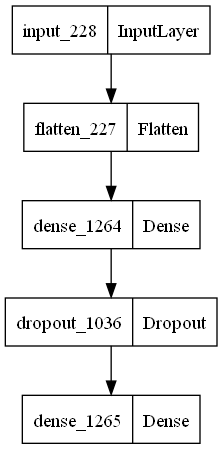

In [114]:
final_ann = tuner.hypermodel.build(best_hps)

keras.utils.plot_model(final_ann, "final_ann.png")

##### Find the optimal epochs for the final model

In [115]:
final_ann_epochs, final_ann, _,_ = get_epochs(final_ann,cv_data=train_val_ifold)

Epoch 1/150
4/4 - 1s - loss: 1.2084 - mape: 124.8364 - mae: 0.9224 - val_loss: 0.6535 - val_mape: 207.2695 - val_mae: 0.7989 - 564ms/epoch - 141ms/step
Epoch 2/150
4/4 - 0s - loss: 0.5596 - mape: 86.6496 - mae: 0.6338 - val_loss: 0.4835 - val_mape: 178.1418 - val_mae: 0.6846 - 117ms/epoch - 29ms/step
Epoch 3/150
4/4 - 0s - loss: 0.2879 - mape: 61.4184 - mae: 0.4520 - val_loss: 0.0690 - val_mape: 64.5177 - val_mae: 0.2312 - 120ms/epoch - 30ms/step
Epoch 4/150
4/4 - 0s - loss: 0.1385 - mape: 40.1002 - mae: 0.2970 - val_loss: 0.0147 - val_mape: 26.3896 - val_mae: 0.0978 - 114ms/epoch - 29ms/step
Epoch 5/150
4/4 - 0s - loss: 0.1493 - mape: 41.9770 - mae: 0.3128 - val_loss: 0.0144 - val_mape: 25.8506 - val_mae: 0.0961 - 121ms/epoch - 30ms/step
Epoch 6/150
4/4 - 0s - loss: 0.1000 - mape: 33.8639 - mae: 0.2522 - val_loss: 0.0203 - val_mape: 33.0897 - val_mae: 0.1142 - 120ms/epoch - 30ms/step
Epoch 7/150
4/4 - 0s - loss: 0.0586 - mape: 25.5607 - mae: 0.1911 - val_loss: 0.0378 - val_mape: 47.10

In [116]:
print('The optimal epochs for the final model is:', final_ann_epochs)

The optimal epochs for the final model is: 52


##### Train the final model

In [117]:
final_ann.fit(train_val_tensor, epochs=final_ann_epochs)

Epoch 1/52
21/21 [==============================] - 0s 7ms/step - loss: 0.0121 - mape: 165714.5625 - mae: 0.0801
Epoch 2/52
21/21 [==============================] - 0s 7ms/step - loss: 0.0130 - mape: 166318.1094 - mae: 0.0883
Epoch 3/52
21/21 [==============================] - 0s 7ms/step - loss: 0.0369 - mape: 176614.4688 - mae: 0.1560
Epoch 4/52
21/21 [==============================] - 0s 7ms/step - loss: 0.0239 - mape: 167931.8750 - mae: 0.1258
Epoch 5/52
21/21 [==============================] - 0s 8ms/step - loss: 0.0208 - mape: 168102.6875 - mae: 0.1205
Epoch 6/52
21/21 [==============================] - 0s 8ms/step - loss: 0.0233 - mape: 187613.5312 - mae: 0.1256
Epoch 7/52
21/21 [==============================] - 0s 8ms/step - loss: 0.0209 - mape: 179703.0000 - mae: 0.1152
Epoch 8/52
21/21 [==============================] - 0s 8ms/step - loss: 0.0152 - mape: 170450.1875 - mae: 0.0958
Epoch 9/52
21/21 [==============================] - 0s 7ms/step - loss: 0.0147 - mape: 172448.18

#### Save trained final ANN model

In [118]:
final_ann.save('final_ANN.keras')

### Baseline models-LSTM

#### Simple LSTM

In [119]:
# define model architecture

inputs = layers.Input(shape=(window, features))
# add LSTM layer
tensor = layers.LSTM(2, activation = "relu")(inputs)
outputs = layers.Dense(1)(tensor)
simple_LSTM = keras.Model(inputs, outputs)

# save best performed model during training
callbacks = [
    keras.callbacks.ModelCheckpoint("STI_LSTM.keras", save_best_only = True)
]

# define model optimisation algorithm
simple_LSTM.compile(optimizer = "adam", loss = "mse", metrics = ["mape", "mae"])


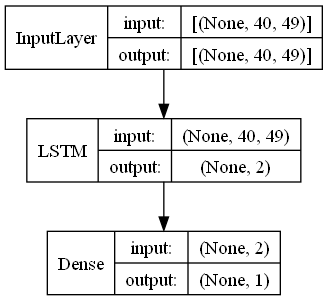

In [120]:
# visualize model structure
plot_model(simple_LSTM, to_file='images/simple_LSTM.png', 
           show_shapes=True, show_layer_names=False)

In [121]:
# train the model using one slice of data
t = train_val_ifold[-2][0]
v = train_val_ifold[-2][1]

history_simple_LSTM = simple_LSTM.fit(
                t,
                epochs = 50,
                validation_data =v,
                callbacks = callbacks
                )

Epoch 1/50
17/17 [==============================] - 3s 95ms/step - loss: 0.0561 - mape: 100217.7422 - mae: 0.1937 - val_loss: 0.3699 - val_mape: 89.2277 - val_mae: 0.5931
Epoch 2/50
17/17 [==============================] - 1s 84ms/step - loss: 0.0248 - mape: 134630.9531 - mae: 0.1301 - val_loss: 0.4425 - val_mape: 98.1579 - val_mae: 0.6525
Epoch 3/50
17/17 [==============================] - 1s 84ms/step - loss: 0.0154 - mape: 119245.0391 - mae: 0.1017 - val_loss: 0.1715 - val_mape: 60.6025 - val_mae: 0.4026
Epoch 4/50
17/17 [==============================] - 1s 81ms/step - loss: 0.0112 - mape: 114377.2969 - mae: 0.0858 - val_loss: 0.1052 - val_mape: 47.1773 - val_mae: 0.3132
Epoch 5/50
17/17 [==============================] - 1s 81ms/step - loss: 0.0094 - mape: 107357.8203 - mae: 0.0790 - val_loss: 0.0799 - val_mape: 40.9884 - val_mae: 0.2720
Epoch 6/50
17/17 [==============================] - 1s 81ms/step - loss: 0.0083 - mape: 108807.9688 - mae: 0.0739 - val_loss: 0.0573 - val_mape: 

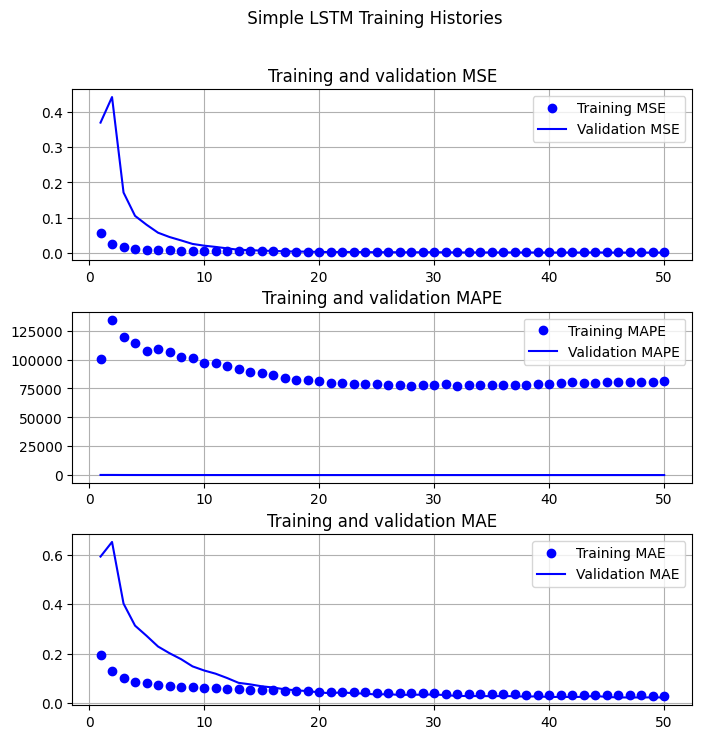

In [122]:
# plot model performance during training
fig=plot_history(history_simple_LSTM, title=" Simple LSTM Training Histories")
fig.savefig('images/simple_LSTM_histories.png',dpi='figure')

In [123]:
# save the results
simple_LSTM_results = simple_LSTM.evaluate(test_dataset)

1/1 [==============================] - 0s 71ms/step - loss: 0.0135 - mape: 14.6921 - mae: 0.1085


#### Hyperparameter tunning for optimised LSTM

In [124]:
# define hypermodel 
def hyp_LSTM(hp): 
    """
    Builds LSTM models based on instances of HyperParameters object 
    from pre-defined hyperparameter space.
    
    Parameters
    ----------
    hp : HyperParameter object
    
    Returns
    -------
    model : keras model
            neuron network models built on HyperParameter object instances. 
    """
    
    # Dense layers features
    LSTM_layers = hp.Int("layers", min_value = 1, max_value = 10, step = 2)
    dropout = hp.Choice('dropout',[0.0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6])
    activation = hp.Choice("activation", ["relu", "tanh"])
              
    # model structures
    inputs=layers.Input(shape=(window, features))
    tensors = inputs
    for i in range(LSTM_layers):
        tensors = layers.LSTM(units=hp.Int('neurons_'+str(i), min_value =2,
                                           max_value = 32, step = 6), 
                              activation=activation,
                              # Return entire sequence of each sample
                              return_sequences=True, 
                              recurrent_dropout=dropout
                             )(tensors)
    
    outputs=layers.LSTM(1,activation=activation)(tensors)  
    outputs = layers.Dense(1)(outputs) # add regressor
    model = keras.Model(inputs, outputs) # build model

    # learning rate
    lr = hp.Float("lr", min_value = 1e-4, max_value = 1e-2, sampling = "log")
    
    # compile model
    model.compile(optimizer = keras.optimizers.Adam(learning_rate = lr),
             loss = keras.losses.MeanSquaredError(),
             metrics = ['mape','mae'])
    
    return model

##### Define tunner and tuning for the optimal hyperparameters

In [125]:
# Instantiate tuner  
tuner = CVTuner(
            hypermodel=hyp_LSTM,
            max_trials=25,
            objective=kt.Objective("v_loss", "min"),
            overwrite=True,
            directory='hypTuning',
            project_name='LSTM',  
            )


tuner.search(data=train_val_ifold)

Trial 25 Complete [00h 38m 22s]
v_loss: 0.10232775679065122

Best v_loss So Far: 0.027493769225353997
Total elapsed time: 21h 51m 19s


In [126]:
tuner.search_space_summary()

Search space summary
Default search space size: 13
layers (Int)
{'default': None, 'conditions': [], 'min_value': 1, 'max_value': 10, 'step': 2, 'sampling': 'linear'}
dropout (Choice)
{'default': 0.0, 'conditions': [], 'values': [0.0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6], 'ordered': True}
activation (Choice)
{'default': 'relu', 'conditions': [], 'values': ['relu', 'tanh'], 'ordered': False}
neurons_0 (Int)
{'default': None, 'conditions': [], 'min_value': 2, 'max_value': 32, 'step': 6, 'sampling': 'linear'}
lr (Float)
{'default': 0.0001, 'conditions': [], 'min_value': 0.0001, 'max_value': 0.01, 'step': None, 'sampling': 'log'}
neurons_1 (Int)
{'default': None, 'conditions': [], 'min_value': 2, 'max_value': 32, 'step': 6, 'sampling': 'linear'}
neurons_2 (Int)
{'default': None, 'conditions': [], 'min_value': 2, 'max_value': 32, 'step': 6, 'sampling': 'linear'}
neurons_3 (Int)
{'default': None, 'conditions': [], 'min_value': 2, 'max_value': 32, 'step': 6, 'sampling': 'linear'}
neurons_4 (Int)
{'de

In [127]:
tuner.results_summary()  

Results summary
Results in hypTuning\LSTM
Showing 10 best trials
Objective(name="v_loss", direction="min")

Trial 23 summary
Hyperparameters:
layers: 3
dropout: 0.3
activation: relu
neurons_0: 26
lr: 0.002924269946621087
neurons_1: 2
neurons_2: 14
neurons_3: 20
neurons_4: 26
neurons_5: 14
neurons_6: 32
neurons_7: 20
neurons_8: 2
Score: 0.027493769225353997

Trial 19 summary
Hyperparameters:
layers: 7
dropout: 0.4
activation: tanh
neurons_0: 14
lr: 0.0008365138019680478
neurons_1: 26
neurons_2: 8
neurons_3: 14
neurons_4: 14
neurons_5: 14
neurons_6: 2
neurons_7: 26
neurons_8: 14
Score: 0.03191029057941503

Trial 00 summary
Hyperparameters:
layers: 7
dropout: 0.2
activation: tanh
neurons_0: 8
lr: 0.00048359602686260045
neurons_1: 2
neurons_2: 2
neurons_3: 2
neurons_4: 2
neurons_5: 2
neurons_6: 2
Score: 0.03603404413701759

Trial 07 summary
Hyperparameters:
layers: 7
dropout: 0.2
activation: tanh
neurons_0: 20
lr: 0.007684964586710821
neurons_1: 32
neurons_2: 8
neurons_3: 2
neurons_4: 26
n

In [128]:
# Get the best hyperparameters.
best_hps = tuner.get_best_hyperparameters()[0]
print(best_hps.values)

{'layers': 3, 'dropout': 0.3, 'activation': 'relu', 'neurons_0': 26, 'lr': 0.002924269946621087, 'neurons_1': 2, 'neurons_2': 14, 'neurons_3': 20, 'neurons_4': 26, 'neurons_5': 14, 'neurons_6': 32, 'neurons_7': 20, 'neurons_8': 2}


#### Build and train final LSTM model

##### Build and visualize the final model

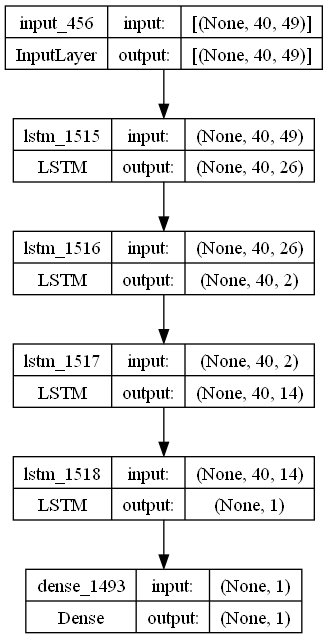

In [129]:
final_LSTM = tuner.hypermodel.build(best_hps)

keras.utils.plot_model(final_LSTM, "images/final_LSTM.png", show_shapes=True)

##### Find the optimal epochs for the final model

In [130]:
final_LSTM_epochs, final_LSTM, _,_ = get_epochs(final_LSTM,cv_data=train_val_ifold)

Epoch 1/150
4/4 - 9s - loss: 0.5541 - mape: 99.4955 - mae: 0.7400 - val_loss: 0.1808 - val_mape: 96.7464 - val_mae: 0.4126 - 9s/epoch - 2s/step
Epoch 2/150
4/4 - 3s - loss: 0.5335 - mape: 97.5869 - mae: 0.7260 - val_loss: 0.1666 - val_mape: 92.3516 - val_mae: 0.3951 - 3s/epoch - 669ms/step
Epoch 3/150
4/4 - 3s - loss: 0.4978 - mape: 94.1787 - mae: 0.7009 - val_loss: 0.1344 - val_mape: 82.0827 - val_mae: 0.3532 - 3s/epoch - 688ms/step
Epoch 4/150
4/4 - 3s - loss: 0.3897 - mape: 82.6181 - mae: 0.6152 - val_loss: 0.3189 - val_mape: 113.9565 - val_mae: 0.4723 - 3s/epoch - 677ms/step
Epoch 5/150
4/4 - 3s - loss: 0.4540 - mape: 70.5035 - mae: 0.5215 - val_loss: 0.0785 - val_mape: 59.9465 - val_mae: 0.2641 - 3s/epoch - 665ms/step
Epoch 6/150
4/4 - 3s - loss: 0.3009 - mape: 72.8919 - mae: 0.5431 - val_loss: 0.0715 - val_mape: 56.7000 - val_mae: 0.2510 - 3s/epoch - 662ms/step
Epoch 7/150
4/4 - 3s - loss: 0.2773 - mape: 69.8113 - mae: 0.5208 - val_loss: 0.0524 - val_mape: 46.7624 - val_mae: 0.21

In [131]:
print('The optimal epochs for the final model is:', final_LSTM_epochs)

The optimal epochs for the final model is: 8


##### Train the final model

In [132]:
final_LSTM.fit(train_val_tensor, epochs=final_LSTM_epochs)

Epoch 1/8
21/21 [==============================] - 13s 621ms/step - loss: 5.0806e-04 - mape: 39385.6562 - mae: 0.0160
Epoch 2/8
21/21 [==============================] - 13s 616ms/step - loss: 0.0036 - mape: 31601.6406 - mae: 0.0478
Epoch 3/8
21/21 [==============================] - 13s 609ms/step - loss: 0.0370 - mape: 122118.1797 - mae: 0.1572
Epoch 4/8
21/21 [==============================] - 13s 604ms/step - loss: 0.0209 - mape: 93080.5859 - mae: 0.1105
Epoch 5/8
21/21 [==============================] - 13s 609ms/step - loss: 0.0050 - mape: 88284.8984 - mae: 0.0555
Epoch 6/8
21/21 [==============================] - 13s 606ms/step - loss: 0.0124 - mape: 137561.9531 - mae: 0.0922
Epoch 7/8
21/21 [==============================] - 13s 609ms/step - loss: 0.0065 - mape: 116141.3516 - mae: 0.0654
Epoch 8/8
21/21 [==============================] - 13s 608ms/step - loss: 0.0081 - mape: 138002.9219 - mae: 0.0755


#### Save trained final LSTM model

In [133]:
final_LSTM.save('final_LSTM.keras')

### Baseline models-1D-CNN

#### Simple 1D-CNN

In [134]:
# define model architecture

inputs = layers.Input(shape=(window, features))
# add LSTM layer
tensor = layers.Conv1D(3,2, activation = "relu")(inputs)
tensor = layers.GlobalAveragePooling1D()(tensor)
outputs = layers.Dense(1)(tensor)
CNN_1D = keras.Model(inputs, outputs)

# save best performed model during training
callbacks = [
    keras.callbacks.ModelCheckpoint("STI_CNN_1D.keras", save_best_only = True)
]

# define model optimisation algorithm
CNN_1D.compile(optimizer = "adam", loss = "mse", metrics = ["mape", "mae"])


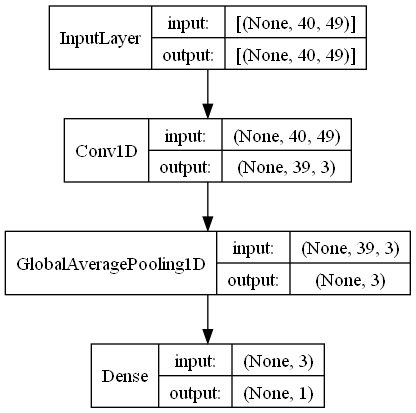

In [135]:
# visualize model structure
plot_model(CNN_1D, to_file='images/simple_CNN_1D.png',
           show_shapes=True, show_layer_names=False)

In [136]:
# train the model
history_CNN_1D = CNN_1D.fit(
                train_val_tensor,
                epochs = 50,
                validation_data =test_dataset,
                callbacks = callbacks
                )

Epoch 1/50
21/21 [==============================] - 5s 21ms/step - loss: 0.1022 - mape: 286149.5312 - mae: 0.2489 - val_loss: 0.1548 - val_mape: 53.5282 - val_mae: 0.3920
Epoch 2/50
21/21 [==============================] - 0s 11ms/step - loss: 0.0382 - mape: 267202.2188 - mae: 0.1550 - val_loss: 0.2659 - val_mape: 70.1890 - val_mae: 0.5142
Epoch 3/50
21/21 [==============================] - 0s 11ms/step - loss: 0.0233 - mape: 229203.3125 - mae: 0.1189 - val_loss: 0.3189 - val_mape: 76.8776 - val_mae: 0.5632
Epoch 4/50
21/21 [==============================] - 0s 11ms/step - loss: 0.0259 - mape: 202406.5781 - mae: 0.1294 - val_loss: 0.1660 - val_mape: 55.4149 - val_mae: 0.4054
Epoch 5/50
21/21 [==============================] - 0s 12ms/step - loss: 0.0213 - mape: 235550.3750 - mae: 0.1212 - val_loss: 0.0384 - val_mape: 26.3835 - val_mae: 0.1921
Epoch 6/50
21/21 [==============================] - 0s 11ms/step - loss: 0.0240 - mape: 281205.6250 - mae: 0.1218 - val_loss: 0.0679 - val_mape: 

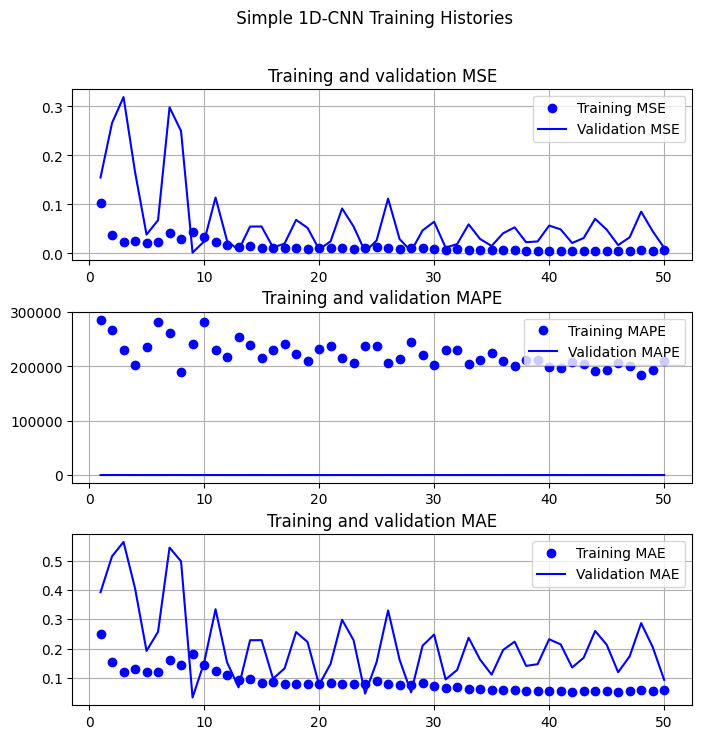

In [137]:
# plot model performance during training
fig=plot_history(history_CNN_1D, title=" Simple 1D-CNN Training Histories")
fig.savefig('images/simple_CNN1D_histories.png',dpi='figure')

#### Hyperparameter tunning for optimised CNN_1D

In [138]:
# define hypermodel 
def hyp_CNN_1D(hp): 
    """
    Builds CNN_1D models based on instances of HyperParameters object 
    from pre-defined hyperparameter space.
    
    Parameters
    ----------
    hp : HyperParameter object
    
    Returns
    -------
    model : keras model
            neuron network models built on HyperParameter object instances. 
    """
    
    # Dense layers features
    CNN_1D_layers = hp.Int("layers", min_value = 2, max_value = 30, step = 1)
    kernel_size = hp.Int("kernel_size", min_value = 2, max_value = 20, step = 1)
    pooling_size =  hp.Int("pooling", min_value = 2, max_value = 5, step = 1)
    dropout = hp.Choice('dropout',[0.0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7]) 
    maxpooling = hp.Boolean('MaxPooling')
               
    # model structures
    inputs=layers.Input(shape=(window, features))
    tensors = inputs
    for i in range(CNN_1D_layers):
        # tuning Cov1D + MaxPooling layers
        if tensors.shape[1] -(kernel_size+pooling_size) > 0:
            tensors = layers.Conv1D(filters=hp.Int('filters_'+str(i), min_value =16,
                                                   max_value = 512, step = 32), 
                                    kernel_size=kernel_size,
                                    padding='valid', 
                                    activation=hp.Choice("activation"+str(i),
                                                         ["relu", "tanh"]),
                                    )(tensors)
            # tune max pooling layer
            if maxpooling:
                tensors = layers.MaxPooling1D(pool_size=pooling_size,
                                              strides=1,
                                              )(tensors)
            # Tuning dropout layer
            tensors = layers.Dropout(dropout)(tensors) 
        else:
            break
    # downsampling by taking average value of time dimension
    outputs=layers.GlobalAveragePooling1D()(tensors)  
    outputs = layers.Dense(1)(outputs) # add regressor
    model = keras.Model(inputs, outputs) # build model

    # learning rate
    lr = hp.Float("lr", min_value = 1e-4, max_value = 1e-2, sampling = "log")
    
    # compile model
    model.compile(optimizer = keras.optimizers.Adam(learning_rate = lr),
             loss = keras.losses.MeanSquaredError(),
             metrics = ['mape','mae'])
    
    return model


##### Define tunner and tuning for the optimal hyperparameters

In [139]:
# Instantiate tuner  
tuner = CVTuner(
            hypermodel=hyp_CNN_1D,
            max_trials=25,
            objective=kt.Objective("v_loss", "min"),
            overwrite=True,
            directory='hypTuning',
            project_name='CNN_1D',           
              )
tuner.search(data=train_val_ifold)

Trial 25 Complete [00h 01m 12s]
v_loss: 0.040520980255678296

Best v_loss So Far: 0.009760028320468135
Total elapsed time: 00h 30m 20s


In [140]:
tuner.search_space_summary()

Search space summary
Default search space size: 30
layers (Int)
{'default': None, 'conditions': [], 'min_value': 2, 'max_value': 30, 'step': 1, 'sampling': 'linear'}
kernel_size (Int)
{'default': None, 'conditions': [], 'min_value': 2, 'max_value': 20, 'step': 1, 'sampling': 'linear'}
pooling (Int)
{'default': None, 'conditions': [], 'min_value': 2, 'max_value': 5, 'step': 1, 'sampling': 'linear'}
dropout (Choice)
{'default': 0.0, 'conditions': [], 'values': [0.0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7], 'ordered': True}
MaxPooling (Boolean)
{'default': False, 'conditions': []}
filters_0 (Int)
{'default': None, 'conditions': [], 'min_value': 16, 'max_value': 512, 'step': 32, 'sampling': 'linear'}
activation0 (Choice)
{'default': 'relu', 'conditions': [], 'values': ['relu', 'tanh'], 'ordered': False}
filters_1 (Int)
{'default': None, 'conditions': [], 'min_value': 16, 'max_value': 512, 'step': 32, 'sampling': 'linear'}
activation1 (Choice)
{'default': 'relu', 'conditions': [], 'values': ['re

In [141]:
tuner.results_summary()  

Results summary
Results in hypTuning\CNN_1D
Showing 10 best trials
Objective(name="v_loss", direction="min")

Trial 17 summary
Hyperparameters:
layers: 11
kernel_size: 19
pooling: 2
dropout: 0.4
MaxPooling: False
filters_0: 112
activation0: tanh
filters_1: 368
activation1: tanh
lr: 0.0002678776495884289
filters_2: 16
activation2: relu
filters_3: 368
activation3: tanh
filters_4: 432
activation4: relu
filters_5: 496
activation5: relu
filters_6: 112
activation6: relu
filters_7: 464
activation7: tanh
filters_8: 240
activation8: relu
filters_9: 112
activation9: relu
filters_10: 432
activation10: relu
filters_11: 240
activation11: tanh
Score: 0.009760028320468135

Trial 13 summary
Hyperparameters:
layers: 4
kernel_size: 14
pooling: 5
dropout: 0.1
MaxPooling: False
filters_0: 208
activation0: tanh
filters_1: 208
activation1: tanh
lr: 0.00010297618518399508
filters_2: 48
activation2: tanh
filters_3: 16
activation3: tanh
filters_4: 80
activation4: relu
filters_5: 16
activation5: relu
filters_6:

In [142]:
# Get the best hyperparameters.
best_hps = tuner.get_best_hyperparameters()[0]
print(best_hps.values)

{'layers': 11, 'kernel_size': 19, 'pooling': 2, 'dropout': 0.4, 'MaxPooling': False, 'filters_0': 112, 'activation0': 'tanh', 'filters_1': 368, 'activation1': 'tanh', 'lr': 0.0002678776495884289, 'filters_2': 16, 'activation2': 'relu', 'filters_3': 368, 'activation3': 'tanh', 'filters_4': 432, 'activation4': 'relu', 'filters_5': 496, 'activation5': 'relu', 'filters_6': 112, 'activation6': 'relu', 'filters_7': 464, 'activation7': 'tanh', 'filters_8': 240, 'activation8': 'relu', 'filters_9': 112, 'activation9': 'relu', 'filters_10': 432, 'activation10': 'relu', 'filters_11': 240, 'activation11': 'tanh'}


#### Build and train final CNN_1D model

##### Build and visualize the final model

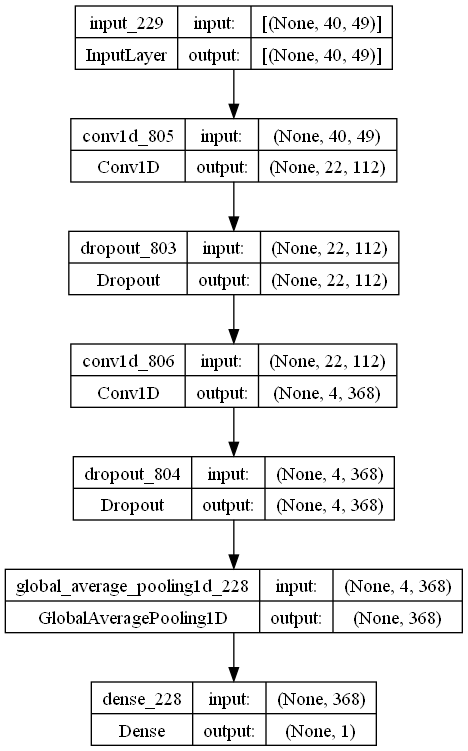

In [143]:
final_CNN1D = tuner.hypermodel.build(best_hps)

keras.utils.plot_model(final_CNN1D, "images/final_CNN1D.png", show_shapes=True)

##### Find the optimal epochs for the final model

In [144]:
final_CNN1D_epochs,final_CNN1D, _,_ = get_epochs(final_CNN1D,cv_data=train_val_ifold)

Epoch 1/150
4/4 - 1s - loss: 4.5062 - mape: 236.7319 - mae: 1.7284 - val_loss: 1.4635 - val_mape: 289.0809 - val_mae: 1.1927 - 727ms/epoch - 182ms/step
Epoch 2/150
4/4 - 0s - loss: 1.9257 - mape: 164.4422 - mae: 1.2168 - val_loss: 3.8515 - val_mape: 497.8678 - val_mae: 1.9567 - 128ms/epoch - 32ms/step
Epoch 3/150
4/4 - 0s - loss: 1.3889 - mape: 143.5131 - mae: 1.0638 - val_loss: 0.0256 - val_mape: 38.7656 - val_mae: 0.1299 - 126ms/epoch - 31ms/step
Epoch 4/150
4/4 - 0s - loss: 0.8179 - mape: 119.1902 - mae: 0.8719 - val_loss: 0.0458 - val_mape: 53.2368 - val_mae: 0.1796 - 124ms/epoch - 31ms/step
Epoch 5/150
4/4 - 0s - loss: 0.1326 - mape: 40.6725 - mae: 0.3015 - val_loss: 0.8902 - val_mape: 242.0722 - val_mae: 0.9367 - 125ms/epoch - 31ms/step
Epoch 6/150
4/4 - 0s - loss: 0.2952 - mape: 69.0689 - mae: 0.5066 - val_loss: 0.0357 - val_mape: 48.2116 - val_mae: 0.1666 - 128ms/epoch - 32ms/step
Epoch 7/150
4/4 - 0s - loss: 0.0902 - mape: 33.3166 - mae: 0.2520 - val_loss: 0.0715 - val_mape: 5

In [145]:
print('The optimal epochs for the final model is:', final_CNN1D_epochs)

The optimal epochs for the final model is: 11


##### Train the final model

In [146]:
final_CNN1D.fit(train_val_tensor, epochs=final_CNN1D_epochs)

Epoch 1/11
21/21 [==============================] - 0s 12ms/step - loss: 1.7328 - mape: 591716.7500 - mae: 0.7538
Epoch 2/11
21/21 [==============================] - 0s 9ms/step - loss: 0.2665 - mape: 113249.9453 - mae: 0.3940
Epoch 3/11
21/21 [==============================] - 0s 9ms/step - loss: 0.0917 - mape: 340339.4688 - mae: 0.2437
Epoch 4/11
21/21 [==============================] - 0s 10ms/step - loss: 0.0811 - mape: 168745.5781 - mae: 0.2296
Epoch 5/11
21/21 [==============================] - 0s 9ms/step - loss: 0.0939 - mape: 349721.3750 - mae: 0.2483
Epoch 6/11
21/21 [==============================] - 0s 9ms/step - loss: 0.0786 - mape: 165251.2500 - mae: 0.2246
Epoch 7/11
21/21 [==============================] - 0s 9ms/step - loss: 0.0785 - mape: 259414.1406 - mae: 0.2233
Epoch 8/11
21/21 [==============================] - 0s 9ms/step - loss: 0.0717 - mape: 287766.1562 - mae: 0.2152
Epoch 9/11
21/21 [==============================] - 0s 9ms/step - loss: 0.0718 - mape: 270303.

#### Save trained final CNN1D model

In [147]:
final_CNN1D.save('final_CNN1D.keras')

### TCN model

#### Simple TCN

In [148]:
# instantiate a TCN layer
TCN_layer = TCN(nb_filters=6,
            kernel_size=3,
            nb_stacks=1,
            dilations=(1,2),
            padding='causal',
            use_skip_connections=True,
            dropout_rate=0.0,
            return_sequences=False,
            activation='relu',
            kernel_initializer='he_normal',
            use_batch_norm=False,
            use_layer_norm=True,
            use_weight_norm=False
            )

inputs = layers.Input(shape=(window, features))
TCN_layer = TCN_layer(inputs) # add TCN layer
outputs = layers.Dense(1)(TCN_layer)
simple_TCN = keras.Model(inputs, outputs)

# plot model
keras.utils.plot_model(simple_TCN, "images/simple_TCN.png", show_shapes=True)

# define model optimisation algorithm
simple_TCN.compile(optimizer = "adam", loss = "mse", metrics = ["mape", "mae"])


In [149]:
# train the model
history_TCN = simple_TCN.fit(
                train_val_tensor,
                epochs = 50,
                validation_data =test_dataset,
                callbacks = [tensorboard_callback]
                )

Epoch 1/50
21/21 [==============================] - 2s 48ms/step - loss: 2.9337 - mape: 559049.8125 - mae: 1.6874 - val_loss: 2.0639 - val_mape: 194.9677 - val_mae: 1.4358
Epoch 2/50
21/21 [==============================] - 1s 26ms/step - loss: 1.5640 - mape: 401274.6875 - mae: 1.2328 - val_loss: 1.2345 - val_mape: 150.7455 - val_mae: 1.1103
Epoch 3/50
21/21 [==============================] - 1s 24ms/step - loss: 0.8625 - mape: 187563.1094 - mae: 0.9071 - val_loss: 0.7039 - val_mape: 113.6673 - val_mae: 0.8381
Epoch 4/50
21/21 [==============================] - 1s 26ms/step - loss: 0.4983 - mape: 107419.5156 - mae: 0.6810 - val_loss: 0.4371 - val_mape: 89.4344 - val_mae: 0.6599
Epoch 5/50
21/21 [==============================] - 1s 24ms/step - loss: 0.2944 - mape: 29649.0586 - mae: 0.5102 - val_loss: 0.2592 - val_mape: 68.6945 - val_mae: 0.5075
Epoch 6/50
21/21 [==============================] - 0s 23ms/step - loss: 0.1636 - mape: 41092.5742 - mae: 0.3706 - val_loss: 0.1410 - val_mape:

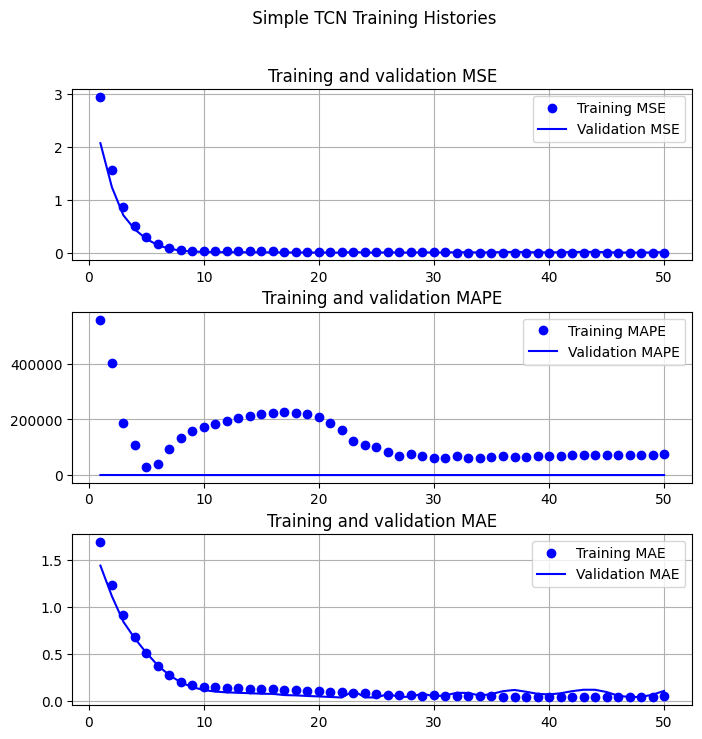

In [150]:
# plot model performance during training
fig=plot_history(history_TCN, title=" Simple TCN Training Histories")
fig.savefig('images/simple_TCN_histories.png',dpi='figure')

#### Hyperparameter tunning for optimised TCN model

In [151]:
# define different types of Temporal Casual layers
TCL = {'d1':(1,2), 'd2':(1,2,4), 'd3':(1,2,4,8), 'd4':(1,2,4,8,16),
       'd5':(1,2,4,8,16,64)}

# define hypermodel 
def hyp_TCN(hp): 
    """
    Builds TCN models based on instances of HyperParameters object 
    from pre-defined hyperparameter space.
    
    Parameters
    ----------
    hp : HyperParameter object
    
    Returns
    -------
    model : keras model
            neuron network models built on HyperParameter object instances. 
    """
       
    # hyperparameters
    kernel_size=hp.Int('kernel_size', min_value=2, max_value=6, step=1)
    nb_filters=hp.Int('nb_filters1', min_value=6, max_value=64, step=2)
    dropout = hp.Choice('dropout',[0.0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7])
    activation=hp.Choice("activation", ["relu", "tanh"])
    # learning rate
    lr = hp.Float("lr", min_value = 1e-4, max_value = 1e-2, sampling = "log")
    # tcn_layer=hp.Boolean("TCN")
    # tune dilation layers
    dilations = hp.Choice('dilations', ['d1', 'd2','d3','d4','d5'])
   
    
    
    # model structures
    inputs=layers.Input(shape=(window, features))
    
    # tuning TCN network
    with hp.conditional_scope("dilations", ['d1']):
        if dilations == 'd1':
            tensors=TCN(
                            nb_filters=nb_filters,
                            kernel_size=kernel_size,
                            dropout_rate=dropout,
                            activation=activation,
                            dilations=TCL['d1'],
                            use_weight_norm=True)(inputs)
    with hp.conditional_scope("dilations", ['d2']):
        if dilations == 'd2':
            tensors=TCN(
                            nb_filters=nb_filters,
                            kernel_size=kernel_size,
                            dropout_rate=dropout,
                            activation=activation,
                            dilations=TCL['d2'],
                            use_weight_norm=True)(inputs)  
    with hp.conditional_scope("dilations", ['d3']):
        if dilations == 'd3':
            tensors=TCN(
                            nb_filters=nb_filters,
                            kernel_size=kernel_size,
                            dropout_rate=dropout,
                            activation=activation,
                            dilations=TCL['d3'],
                            use_weight_norm=True)(inputs) 
    with hp.conditional_scope("dilations", ['d4']):
        if dilations == 'd4':
            tensors=TCN(
                            nb_filters=nb_filters,
                            kernel_size=kernel_size,
                            dropout_rate=dropout,
                            activation=activation,
                            dilations=TCL['d4'],
                            use_weight_norm=True)(inputs) 
    with hp.conditional_scope("dilations", ['d5']):
        if dilations == 'd5':
            tensors=TCN(
                            nb_filters=nb_filters,
                            kernel_size=kernel_size,
                            dropout_rate=dropout,
                            activation=activation,
                            dilations=TCL['d5'],
                            use_weight_norm=True)(inputs) 
    outputs = layers.Dense(1)(tensors) # add regressor
    model = keras.Model(inputs, outputs) # build model

    # compile model
    model.compile(optimizer = keras.optimizers.Adam(learning_rate = lr),
                  loss = keras.losses.MeanSquaredError(),
                  metrics = ['mape','mae'])
    
    return model

##### Define tunner and tuning for the optimal hyperparameters

In [152]:
# Instantiate tuner  
tuner = CVTuner(
            hypermodel=hyp_TCN,
            max_trials=25,
            objective=kt.Objective("v_loss", "min"),
            overwrite=True,
            directory='hypTuning',
            project_name='TCN',           
          )


tuner.search(data=train_val_ifold)

Trial 25 Complete [00h 02m 45s]
v_loss: 0.03064232479987873

Best v_loss So Far: 0.012863460566020675
Total elapsed time: 00h 55m 15s


In [153]:
tuner.search_space_summary()

Search space summary
Default search space size: 6
kernel_size (Int)
{'default': None, 'conditions': [], 'min_value': 2, 'max_value': 6, 'step': 1, 'sampling': 'linear'}
nb_filters1 (Int)
{'default': None, 'conditions': [], 'min_value': 6, 'max_value': 64, 'step': 2, 'sampling': 'linear'}
dropout (Choice)
{'default': 0.0, 'conditions': [], 'values': [0.0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7], 'ordered': True}
activation (Choice)
{'default': 'relu', 'conditions': [], 'values': ['relu', 'tanh'], 'ordered': False}
lr (Float)
{'default': 0.0001, 'conditions': [], 'min_value': 0.0001, 'max_value': 0.01, 'step': None, 'sampling': 'log'}
dilations (Choice)
{'default': 'd1', 'conditions': [], 'values': ['d1', 'd2', 'd3', 'd4', 'd5'], 'ordered': False}


In [154]:
tuner.results_summary()  

Results summary
Results in hypTuning\TCN
Showing 10 best trials
Objective(name="v_loss", direction="min")

Trial 07 summary
Hyperparameters:
kernel_size: 5
nb_filters1: 18
dropout: 0.6
activation: tanh
lr: 0.0018018826900023162
dilations: d2
Score: 0.012863460566020675

Trial 16 summary
Hyperparameters:
kernel_size: 4
nb_filters1: 58
dropout: 0.6
activation: relu
lr: 0.003979208380153469
dilations: d1
Score: 0.013652572641149163

Trial 10 summary
Hyperparameters:
kernel_size: 2
nb_filters1: 50
dropout: 0.4
activation: tanh
lr: 0.0020550400881636393
dilations: d1
Score: 0.020806994230952114

Trial 18 summary
Hyperparameters:
kernel_size: 3
nb_filters1: 6
dropout: 0.2
activation: tanh
lr: 0.01
dilations: d2
Score: 0.024280262179672718

Trial 02 summary
Hyperparameters:
kernel_size: 3
nb_filters1: 58
dropout: 0.3
activation: relu
lr: 0.009275159422772563
dilations: d5
Score: 0.025264505659126572

Trial 05 summary
Hyperparameters:
kernel_size: 5
nb_filters1: 38
dropout: 0.2
activation: rel

In [155]:
# Get the best hyperparameters.
best_hps = tuner.get_best_hyperparameters()[0]
print(best_hps.values)

{'kernel_size': 5, 'nb_filters1': 18, 'dropout': 0.6, 'activation': 'tanh', 'lr': 0.0018018826900023162, 'dilations': 'd2'}


#### Build and train final TCN model

##### Build and visualize the final model

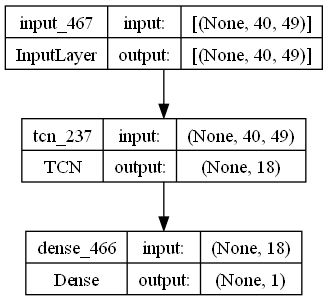

In [156]:
final_TCN = tuner.hypermodel.build(best_hps)

keras.utils.plot_model(final_TCN, "images/final_TCN.png", show_shapes=True)

##### Find the optimal epochs for the final model

In [157]:
final_TCN_epochs,final_TCN, _,_  = get_epochs(final_TCN, cv_data=train_val_ifold)

Epoch 1/150
4/4 - 4s - loss: 0.6447 - mape: 87.8313 - mae: 0.6423 - val_loss: 2.3625 - val_mape: 369.2339 - val_mae: 1.5065 - 4s/epoch - 955ms/step
Epoch 2/150
4/4 - 0s - loss: 0.4657 - mape: 72.7475 - mae: 0.5350 - val_loss: 2.2825 - val_mape: 372.3859 - val_mae: 1.4968 - 193ms/epoch - 48ms/step
Epoch 3/150
4/4 - 0s - loss: 0.3988 - mape: 69.5905 - mae: 0.5098 - val_loss: 0.9650 - val_mape: 239.9703 - val_mae: 0.9667 - 164ms/epoch - 41ms/step
Epoch 4/150
4/4 - 0s - loss: 0.3111 - mape: 60.7683 - mae: 0.4454 - val_loss: 0.3323 - val_mape: 137.8873 - val_mae: 0.5566 - 174ms/epoch - 44ms/step
Epoch 5/150
4/4 - 0s - loss: 0.3027 - mape: 60.4782 - mae: 0.4459 - val_loss: 0.1956 - val_mape: 103.4286 - val_mae: 0.4178 - 176ms/epoch - 44ms/step
Epoch 6/150
4/4 - 0s - loss: 0.2700 - mape: 55.6026 - mae: 0.4126 - val_loss: 0.1867 - val_mape: 102.9162 - val_mae: 0.4117 - 164ms/epoch - 41ms/step
Epoch 7/150
4/4 - 0s - loss: 0.2748 - mape: 55.8426 - mae: 0.4095 - val_loss: 0.1979 - val_mape: 108.4

In [158]:
print('The optimal epochs for the final model is:', final_TCN_epochs)

The optimal epochs for the final model is: 68


##### Train the final model

In [159]:
final_TCN.fit(train_val_tensor, epochs=final_TCN_epochs)

Epoch 1/68
21/21 [==============================] - 0s 15ms/step - loss: 7.7768e-04 - mape: 37932.6328 - mae: 0.0201
Epoch 2/68
21/21 [==============================] - 0s 13ms/step - loss: 0.0014 - mape: 22889.8105 - mae: 0.0279
Epoch 3/68
21/21 [==============================] - 0s 14ms/step - loss: 0.0209 - mape: 133723.1719 - mae: 0.1223
Epoch 4/68
21/21 [==============================] - 0s 14ms/step - loss: 0.0179 - mape: 169604.8906 - mae: 0.1075
Epoch 5/68
21/21 [==============================] - 0s 14ms/step - loss: 0.0065 - mape: 42243.0664 - mae: 0.0631
Epoch 6/68
21/21 [==============================] - 0s 15ms/step - loss: 0.0101 - mape: 104795.0547 - mae: 0.0780
Epoch 7/68
21/21 [==============================] - 0s 14ms/step - loss: 0.0104 - mape: 172041.4688 - mae: 0.0836
Epoch 8/68
21/21 [==============================] - 0s 14ms/step - loss: 0.0065 - mape: 64398.5117 - mae: 0.0649
Epoch 9/68
21/21 [==============================] - 0s 14ms/step - loss: 0.0093 - mape: 

#### Save trained final TCN model

In [160]:
# save trained model
final_TCN.save('final_TCN.keras')

In [161]:
# save the optimal epochs
TCN_epochs={'final_TCN_epochs':final_TCN_epochs}
%store TCN_epochs

# modified code from
# https://levelup.gitconnected.com/how-to-store-variables-in-jupyter-notebook-fea8aa60a9bb

Stored 'TCN_epochs' (dict)


## Evaluate model performance
Now we have find the optimal models for TCN and other baseline models, we can compare their performance. 

In [162]:
# read in the models
final_ANN = load_model('final_ANN.keras')
final_LSTM = load_model('final_LSTM.keras')
final_CNN1D = load_model('final_CNN1D.keras')
final_TCN = load_model('final_TCN.keras', custom_objects={'TCN': TCN})

In [163]:
models = {'ANN':final_ANN, 'LSTM':final_LSTM, 'CNN1D':final_CNN1D, 'TCN':final_TCN}
models_result = {}
models_predict = {}
models_AE={}

In [164]:
# evaluate model performance on test dataset
for name, model in models.items(): 
    preds_test = []
    targets_test = []
    AE_test = []
    for samples, targets in test_dataset:
        targets_test.extend(targets.numpy())
        prd =model.predict(samples).ravel()
        preds_test.extend(prd)
        AE_test.extend(abs(prd-targets.numpy()))
    models_predict[name]=preds_test
    models_result[name]=model.evaluate(test_dataset)
    models_result[name]=[ round(i, 4) for i in models_result[name] ]
    models_AE[name]=AE_test


1/1 [==============================] - 1s 1s/step - loss: 6.7680e-04 - mape: 3.1646 - mae: 0.0235


#### Significance test

In [165]:
# evaluate statistical significance of the predictions  
model_comparison={}
# define control group
model_comparison['TCN']=[models_result['TCN'][0],models_result['TCN'][1],
                         models_result['TCN'][2],None, None, 
                         'This is TCN model as the control group']
# welch t-test
mae_TCN=models_result['TCN'][-1]
AE_TCN=models_AE['TCN']
models_AE.pop('TCN')
for name, AE in models_AE.items():
    sts,p= stats.ttest_ind(models_AE[name], AE_TCN,equal_var=False,
                           alternative='two-sided')
    if (p <= 0.05) & (mean(models_AE[name])>mae_TCN):
        res = f'Model_{name} is significantly worse than the optimal TCN model.'
    elif (p <= 0.05) & (mean(models_AE[name])<mae_TCN):
        res = f'Model_{name} is significantly better than the optimal TCN model.'
    else: 
        res = f'The performance of model_{name} and the optimal TCN model are \n
                not statistically significant.' 
    
    model_comparison[name]=[models_result[name][0],models_result[name][1],
                            models_result[name][2],sts,p,res]

In [166]:
models_result_df = pd.DataFrame.from_dict(model_comparison,orient='index',
                                          columns=['loss', 'mape', 'mae',
                                                   'stats','p_value','Significance']
                                         ).sort_values('mape')
# save results
models_result_df.to_excel('images/Table5_model_performance_comparison.xlsx')

In [167]:
# show results
pd.set_option('display.max_colwidth', None)
models_result_df

,loss,mape,mae,stats,p_value,Significance
TCN,0.0007,3.1646,0.0235,NaN,NaN,This is TCN model as the control group
CNN1D,0.0024,5.7653,0.0413,3.993956,1.901194e-04,Model_CNN1D is significantly worse than the optimal TCN model.
LSTM,0.0051,8.4860,0.0640,7.787509,2.658964e-10,Model_LSTM is significantly worse than the optimal TCN model.
ANN,0.0097,13.1927,0.0959,18.127575,3.814810e-26,Model_ANN is significantly worse than the optimal TCN model.


In [168]:
# generate dataset combining results and the actual target
models_predict_df = pd.DataFrame.from_dict(models_predict,orient='columns')
models_predict_df['target'] = targets_test

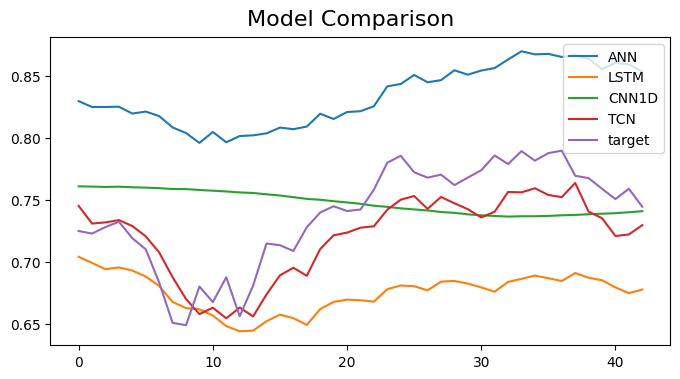

In [169]:
fig,ax = plt.subplots(figsize=(8,4))
fig.suptitle('Model Comparison', fontsize=16, y=0.95)
models_predict_df.plot(ax=ax)
# save the above figure
fig.savefig('images/Model comparison.png',dpi='figure', facecolor='white')

## Evaluate model's capability to generate into future


### Evaluate model's capability to generate into future (Experiment: training on data split fold_4)

In [170]:
# read in the optimal epochs
%store -r
final_TCN_epochs=TCN_epochs['final_TCN_epochs']
final_TCN_epochs

135

In [171]:
# load optimal TCN model
opt_TCN = load_model('final_TCN.keras', custom_objects={'TCN': TCN})

# instantiate a model with same architecture as the optimal TCN model
TCN_g_4 = adapt_model(opt_TCN, (40,49))

In [172]:
# training based data split of fold_4
history_g_4 = TCN_g_4.fit(train_val_ifold[4][0], epochs=final_TCN_epochs, verbose=0)

In [173]:
TCN_g_4.evaluate(train_val_ifold[4][0])

12/12 [==============================] - 1s 6ms/step - loss: 0.0046 - mape: 10.1572 - mae: 0.0580


[0.004571912810206413, 10.15715217590332, 0.05797213315963745]

In [174]:
# define the validation datasets
vals = []
for tr, val in train_val_ifold[4:]:
    vals.append(val)
vals.append(test_dataset)

# evaluate model performance on unseen validation datasets
targets_4 = {}
pred_g_4 = {}
for i, val in enumerate(vals,start=4):
    tgs=[]
    preds=[]
    for samples,targets in val:
        tgs.extend(targets.numpy())
        prd =TCN_g_4.predict(samples).ravel()
        preds.extend(prd)    
    targets_4[i] = tgs
    pred_g_4[i] = preds
        
# evaluate model performance on training dataset
pred_ctrl_4 = []
target_ctrl_4 = []
for samples, targets in train_val_ifold[4][0]:
    target_ctrl_4.extend(targets.numpy())
    prd =TCN_g_4.predict(samples).ravel()
    pred_ctrl_4.extend(prd)

1/1 [==============================] - 0s 23ms/step


In [175]:
pred_g_4.keys()

dict_keys([4, 5, 6, 7, 8, 9])

In [176]:
AE_4 = {}
AE_4[0]=abs(np.array(pred_ctrl_4) - np.array(target_ctrl_4))
print(f'training dataset MAE:',AE_4[0].mean())
for i in range(4,10):
    AE_ = abs(np.array(pred_g_4[i])-np.array(targets_4[i]))
    AE_4[i]=AE_
    print(f'fold_{i} MAE: ', AE_.mean())

training dataset MAE: 0.05797187837700231
fold_4 MAE:  0.15400144297562327
fold_5 MAE:  0.16410764797668193
fold_6 MAE:  0.3370046199739473
fold_7 MAE:  0.29671517873005493
fold_8 MAE:  0.2411627668769474
fold_9 MAE:  0.28840869057185137


In [177]:
# evaluate statistical significance of the predictions   
stats_value = "stats_{place_holder1}" 
p_value = "p_{place_holder2}"

# list of results
res_g_4=[]
res_g_4.append((AE_4[0].mean(), None, None, 
                'This is training dataset as the control group'))
for i in range(4,10):
    sts=stats_value.format(place_holder1=i)
    p=p_value.format(place_holder2=i) 
    sts,p= stats.ttest_ind(AE_4[i], AE_4[0],equal_var=False, alternative='two-sided')
    if (p <= 0.05) & (AE_4[i].mean()>AE_4[0].mean()):
        res = f'prediction on fold_{i} is significantly worse than training dataset.'
    elif (p <= 0.05) & (AE_4[i].mean()<AE_4[0].mean()):
        res = f'prediction on fold_{i} is significantly better than training dataset.'
    else: 
        res = f'prediction on fold_{i} and training dataset are \n
                not statistically significant.' 
    
    res_g_4.append((AE_4[i].mean(),sts,p,res))
    

In [178]:
pd.set_option('display.max_colwidth', None)

# visualize statistical result via pandas data frame
result_g_4 = pd.DataFrame(res_g_4, columns=['MAE','stats','p_value', 'conclusion'])
# save the results
result_g_4.to_excel("images/Table6 TCN perdictions on future datasets.xlsx")
#show results
result_g_4

,MAE,stats,p_value,conclusion
0,0.057972,NaN,NaN,This is training dataset as the control group
1,0.154001,23.747789,1.186564e-58,prediction on fold_4 is significantly worse than training dataset.
2,0.164108,23.471188,2.247819e-57,prediction on fold_5 is significantly worse than training dataset.
3,0.337005,68.619395,1.698094e-135,prediction on fold_6 is significantly worse than training dataset.
4,0.296715,82.635854,1.892988e-162,prediction on fold_7 is significantly worse than training dataset.
5,0.241163,44.157225,2.114479e-75,prediction on fold_8 is significantly worse than training dataset.
6,0.288409,43.708342,2.546015e-38,prediction on fold_9 is significantly worse than training dataset.


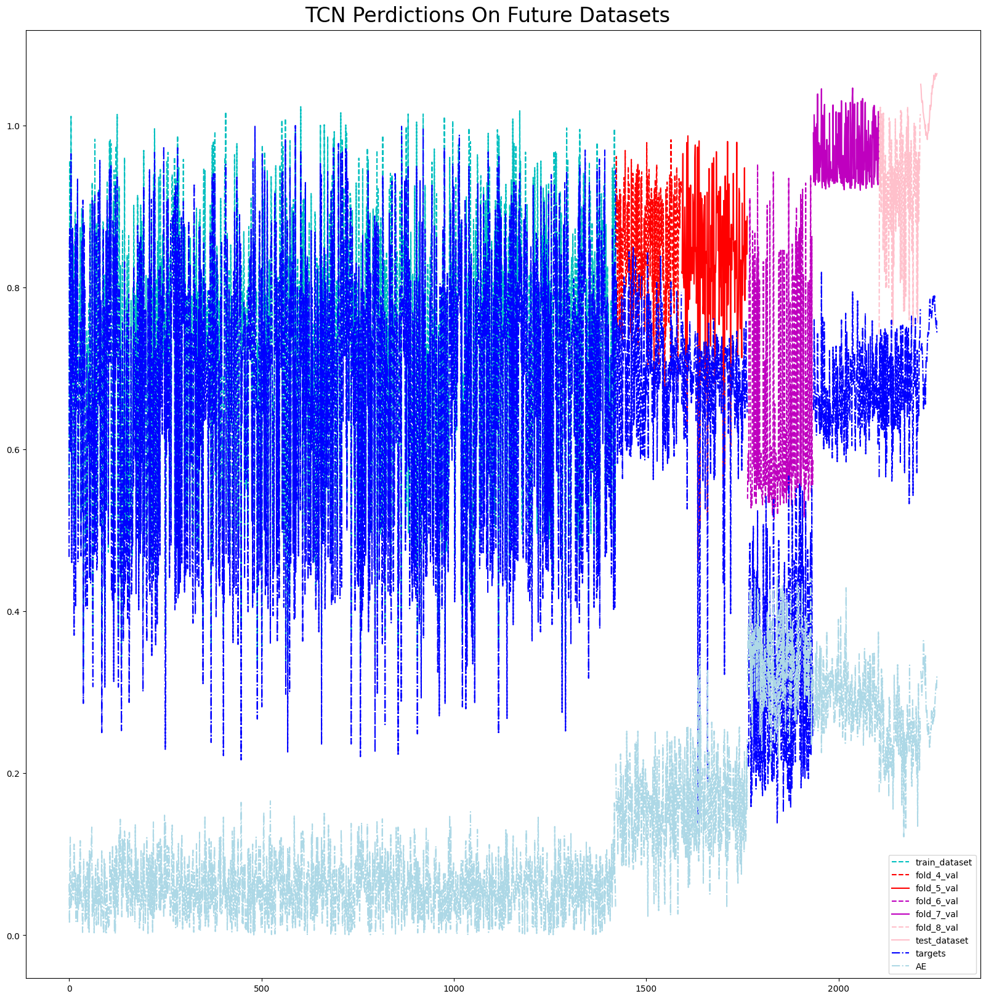

In [179]:
# visualize predictions 
# define starting and ending locations for different validation data plots
l0 = len(pred_ctrl_4)
l1 = len(pred_ctrl_4)+len(pred_g_4[4])
l2 = len(pred_ctrl_4)+len(pred_g_4[4])+len(pred_g_4[5])
l3 = len(pred_ctrl_4)+len(pred_g_4[4])+len(pred_g_4[5])+len(pred_g_4[6])
l4 = len(pred_ctrl_4)+len(pred_g_4[4])+len(pred_g_4[5])+len(
        pred_g_4[6])+len(pred_g_4[7])
l5 = len(pred_ctrl_4)+len(pred_g_4[4])+len(pred_g_4[5])+len(
        pred_g_4[6])+len(pred_g_4[7])+len(pred_g_4[8])
l6 = len(pred_ctrl_4)+len(pred_g_4[4])+len(pred_g_4[5])+len(
        pred_g_4[6])+len(pred_g_4[7])+len(pred_g_4[8])+len(pred_g_4[9])

# plot predictions
fig = plt.figure(figsize=(20, 20))
fig.suptitle('TCN Perdictions On Future Datasets', fontsize=24, y=0.9)
plt.plot(range(l0), pred_ctrl_4, 'c--', label='train_dataset')
plt.plot(range(l0,l1), pred_g_4[4],'r--', label='fold_4_val')
plt.plot(range(l1,l2), pred_g_4[5],'r-', label='fold_5_val')
plt.plot(range(l2,l3),pred_g_4[6],'m--', label='fold_6_val')
plt.plot(range(l3,l4),pred_g_4[7],'m-', label='fold_7_val')
plt.plot(range(l4,l5),pred_g_4[8],'--',color='pink', label='fold_8_val')
plt.plot(range(l5,l6),pred_g_4[9],'-',color='pink', label='test_dataset')


# plot actual target datasets
plt.plot(range(l0), target_ctrl_4, 'b-.')
plt.plot(range(l0,l1), targets_4[4],'b-.', label='targets')
plt.plot(range(l1,l2), targets_4[5],'b-.')
plt.plot(range(l2,l3),targets_4[6],'b-.')
plt.plot(range(l3,l4),targets_4[7],'b-.')
plt.plot(range(l4,l5),targets_4[8],'b-.')
plt.plot(range(l5,l6),targets_4[9],'b-.')

# plot absolute errors
plt.plot(range(l0), abs(np.array(pred_ctrl_4)-np.array(target_ctrl_4)),
         '-.', label='AE', color='lightblue')
plt.plot(range(l0,l1), abs(np.array(pred_g_4[4])-np.array(targets_4[4])),
         '-.', color='lightblue')
plt.plot(range(l1,l2), abs(np.array(pred_g_4[5])-np.array(targets_4[5])),
         '-.', color='lightblue')
plt.plot(range(l2,l3),abs(np.array(pred_g_4[6])-np.array(targets_4[6])),
         '-.', color='lightblue')
plt.plot(range(l3,l4),abs(np.array(pred_g_4[7])-np.array(targets_4[7])),
         '-.', color='lightblue')
plt.plot(range(l4,l5),abs(np.array(pred_g_4[8])-np.array(targets_4[8])),
         '-.', color='lightblue')
plt.plot(range(l5,l6),abs(np.array(pred_g_4[9])-np.array(targets_4[9])),
         '-.', color='lightblue')

plt.legend()
plt.plot()

# save the above figure
fig.savefig('images/TCN perdictions on future datasets.png',
            dpi='figure', facecolor='white')

The prediction is further apart from the actual target values. However, the absolute values are not able to reflect such behavior. This caused our doubt rationality of the loss function. Probably, we should not only evaluate models based on mean square errors. 

### Does cross-validation improve model predictability?

Repeat the previous experiment but pretrain the TCN model with cross-validation on the first four folds of data.

In [180]:
# load optimal TCN model
opt_TCN = load_model('final_TCN.keras', custom_objects={'TCN': TCN})

# Rebuild the model with the same architecture but newly instantiated weights
TCN_g_cv = adapt_model(opt_TCN, (40,49))

In [181]:
_, TCN_g_cv, _,_ = get_epochs(TCN_g_cv, train_val_ifold[:4],
                              epochs=final_TCN_epochs, verbose=0)

In [182]:
TCN_g_cv.fit(train_val_ifold[4][0], epochs=final_TCN_epochs, verbose=0)

In [183]:
# evaluate model performance on unseen validation datasets
targets_cv = {}
pred_g_cv = {}
for i, val in enumerate(vals, start=4):
    tgs=[]
    preds=[]
    for samples,targets in val:
        tgs.extend(targets.numpy())
        prd =TCN_g_cv.predict(samples, verbose=0).ravel()        
        preds.extend(prd)
        
    targets_cv[i] = tgs
    pred_g_cv[i] = preds
        
# evaluate model performance on training dataset
pred_ctrl_cv = []
target_ctrl_cv = []

for samples_, targets_ in train_val_ifold[4][0]:
    target_ctrl_cv.extend(targets_.numpy())
    prd =TCN_g_cv.predict(samples_, verbose=0).ravel()
    pred_ctrl_cv.extend(prd)


In [184]:
AE_cv = {}
AE_cv[0]=abs(np.array(pred_ctrl_cv) - np.array(target_ctrl_cv))
print(f'training dataset MAE:',AE_cv[0].mean())
for i in range(4,10):
    AE_ = abs(np.array(pred_g_cv[i])-np.array(targets_cv[i]))
    AE_cv[i]=AE_
    print(f'Fold_{i} MAE:',AE_.mean())

training dataset MAE: 0.030730186999400458
Fold_4 MAE: 0.06410387625556423
Fold_5 MAE: 0.08846127592596188
Fold_6 MAE: 0.14758934305196678
Fold_7 MAE: 0.25883147560699576
Fold_8 MAE: 0.33990788335802197
Fold_9 MAE: 0.49102567463981256


In [185]:
AE_cv = {}
AE_cv[0]=abs(np.array(pred_ctrl_cv) - np.array(target_ctrl_cv))
print(f'training dataset MAE:',AE_cv[0].mean())
for i in range(4,10):
    AE_ = abs(np.array(pred_g_cv[i])-np.array(targets_cv[i]))
    AE_cv[i]=AE_
    print(f'Fold_{i} MAE:',AE_.mean())

training dataset MAE: 0.030730186999400458
Fold_4 MAE: 0.06410387625556423
Fold_5 MAE: 0.08846127592596188
Fold_6 MAE: 0.14758934305196678
Fold_7 MAE: 0.25883147560699576
Fold_8 MAE: 0.33990788335802197
Fold_9 MAE: 0.49102567463981256


In [186]:
# welch t-test
res_g_cv=[]
res_g_cv.append((AE_cv[0].mean(), None, None,
                 'This is training dataset as the control group'))
for i in range(4,10):
    sts,p= stats.ttest_ind(AE_cv[i], AE_cv[0],equal_var=False, alternative='two-sided')
    res=None
    if (p <= 0.05) & (AE_cv[i].mean()>AE_cv[0].mean()):
        res = f'prediction on fold_{i} is significantly worse than training dataset.'
    elif (p <= 0.05) & (AE_cv[i].mean()<AE_cv[0].mean()):
        res = f'prediction on fold_{i} is significantly better than training dataset.'
    else: 
        res = f'prediction on fold_{i} and training dataset are \n
                not significantly different.' 
    
    res_g_cv.append((AE_cv[i].mean(),sts,p,res))
    # stats_g_cv[i]=res_g

In [187]:
pd.set_option('display.max_colwidth', None)
# visualize statistical result via pandas data frame
result_g_cv = pd.DataFrame(res_g_cv, columns=['MAE','stats','p_value', 'conclusion'])
# save the results
result_g_cv.to_excel('images/Table7 cv trained TCN predictions on future datasets.xlsx')
# show results
result_g_cv

,MAE,stats,p_value,conclusion
0,0.030730,NaN,NaN,This is training dataset as the control group
1,0.064104,14.335995,6.048110e-32,prediction on fold_4 is significantly worse than training dataset.
2,0.088461,19.577922,1.643357e-46,prediction on fold_5 is significantly worse than training dataset.
3,0.147589,36.555576,6.528717e-85,prediction on fold_6 is significantly worse than training dataset.
4,0.258831,37.055852,5.249041e-84,prediction on fold_7 is significantly worse than training dataset.
5,0.339908,112.169936,5.218205e-119,prediction on fold_8 is significantly worse than training dataset.
6,0.491026,123.913054,3.359765e-57,prediction on fold_9 is significantly worse than training dataset.


In [188]:
# compare significane between two models
significance = []
sts_0,p_0= stats.ttest_ind(AE_cv[0],AE_4[0],equal_var=False, alternative='two-sided')
if (p_0 <= 0.05) & (AE_cv[0].mean()<AE_4[0].mean()):
    reslt = f'model trained with cross-validation is significantly better than \n
            the model without cross-validation on training data'
    print(reslt)
elif (p_0 <= 0.05) & (AE_cv[0].mean()>AE_4[0].mean()):
    reslt = f'model trained with cross-validation is significantly worse than \n
            the model without cross-validation on training data'
    print(reslt)
else: 
    reslt = f'model trained with cross-validation has no significant difference \n
            model without cross-validation on training data'
    print(reslt)
significance.append(reslt)
for i in range(4,10):
    sts_,p_= stats.ttest_ind(AE_cv[i],AE_4[i],equal_var=False, alternative='two-sided')
    if (p_ <= 0.05) & (AE_cv[i].mean()<AE_4[i].mean()):
        reslt = f'model trained with cross-validation is significantly better \n
                than the model without cross-validation on fold_{i}'
        print(reslt)
    elif (p_ <= 0.05) & (AE_cv[i].mean()>AE_4[i].mean()):
        reslt = f'model trained with cross-validation is significantly worse than \n
                the model without cross-validation on fold_{i}'
        print(reslt)
    else: 
        reslt = f'model trained with cross-validation has no significant difference \n
                model without cross-validation on fold_{i}'
        print(reslt)
    significance.append(reslt)

model trained with cross-validation is significantly better than the model without cross-validation on training data
model trained with cross-validation is significantly better than the model without cross-validation on fold_4
model trained with cross-validation is significantly better than the model without cross-validation on fold_5
model trained with cross-validation is significantly better than the model without cross-validation on fold_6
model trained with cross-validation is significantly better than the model without cross-validation on fold_7
model trained with cross-validation is significantly worse than the model without cross-validation on fold_8
model trained with cross-validation is significantly worse than the model without cross-validation on fold_9


In [189]:
mae_compare = pd.DataFrame.from_dict({'MAE_nonCV':result_g_4['MAE'],
                                      'MAE_CV':result_g_cv['MAE'],
                                      'Significance':significance}) 
# save the results
mae_compare.to_excel('images/Table8 MAE comparison on future datasets.xlsx')
# show the results
mae_compare

,MAE_nonCV,MAE_CV,Significance
0,0.057972,0.030730,model trained with cross-validation is significantly better than the model without cross-validation on training data
1,0.154001,0.064104,model trained with cross-validation is significantly better than the model without cross-validation on fold_4
2,0.164108,0.088461,model trained with cross-validation is significantly better than the model without cross-validation on fold_5
3,0.337005,0.147589,model trained with cross-validation is significantly better than the model without cross-validation on fold_6
4,0.296715,0.258831,model trained with cross-validation is significantly better than the model without cross-validation on fold_7
5,0.241163,0.339908,model trained with cross-validation is significantly worse than the model without cross-validation on fold_8
6,0.288409,0.491026,model trained with cross-validation is significantly worse than the model without cross-validation on fold_9


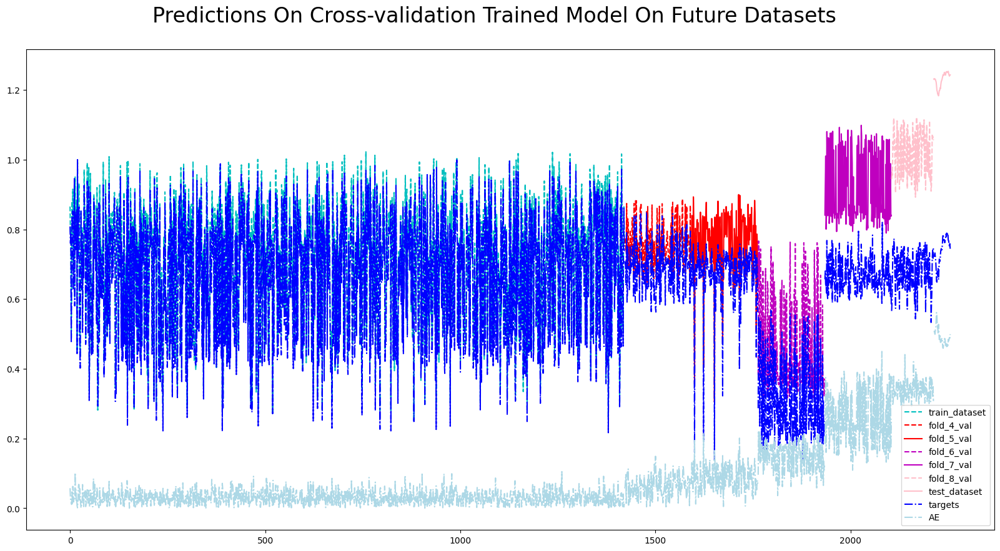

In [190]:
# define starting and ending locations for different validation data plots
l0 = len(pred_ctrl_cv)
l1 = len(pred_ctrl_cv)+len(pred_g_cv[4])
l2 = len(pred_ctrl_cv)+len(pred_g_cv[4])+len(pred_g_cv[5])
l3 = len(pred_ctrl_cv)+len(pred_g_cv[4])+len(pred_g_cv[5])+len(
        pred_g_cv[6])
l4 = len(pred_ctrl_cv)+len(pred_g_cv[4])+len(pred_g_cv[5])+len(
        pred_g_cv[6])+len(pred_g_cv[7])
l5 = len(pred_ctrl_cv)+len(pred_g_cv[4])+len(pred_g_cv[5])+len(
        pred_g_cv[6])+len(pred_g_cv[7])+len(pred_g_cv[8])
l6 = len(pred_ctrl_cv)+len(pred_g_cv[4])+len(pred_g_cv[5])+len(
        pred_g_cv[6])+len(pred_g_cv[7])+len(pred_g_cv[8])+len(pred_g_cv[9])

# plot predictions
fig = plt.figure(figsize=(20, 10))
fig.suptitle('Predictions On Cross-validation Trained Model On Future Datasets',
             fontsize=24, y=0.95)
plt.plot(range(l0), pred_ctrl_cv, 'c--', label='train_dataset')
plt.plot(range(l0,l1), pred_g_cv[4],'r--', label='fold_4_val')
plt.plot(range(l1,l2), pred_g_cv[5],'r-', label='fold_5_val')
plt.plot(range(l2,l3),pred_g_cv[6],'m--', label='fold_6_val')
plt.plot(range(l3,l4),pred_g_cv[7],'m-', label='fold_7_val')
plt.plot(range(l4,l5),pred_g_cv[8],'--',color='pink', label='fold_8_val')
plt.plot(range(l5,l6),pred_g_cv[9],'-',color='pink', label='test_dataset')
                   

# plot actual target datasets
plt.plot(range(l0), target_ctrl_cv, 'b-.')
plt.plot(range(l0,l1), targets_cv[4],'b-.', label='targets')
plt.plot(range(l1,l2), targets_cv[5],'b-.')
plt.plot(range(l2,l3),targets_cv[6],'b-.')
plt.plot(range(l3,l4),targets_cv[7],'b-.')
plt.plot(range(l4,l5),targets_cv[8],'b-.')
plt.plot(range(l5,l6),targets_cv[9],'b-.')

# plot absolute errors
plt.plot(range(l0), abs(np.array(pred_ctrl_cv)-np.array(target_ctrl_cv)),
         '-.', label='AE', color='lightblue')
plt.plot(range(l0,l1), abs(np.array(pred_g_cv[4])-np.array(targets_cv[4])),
         '-.', color='lightblue')
plt.plot(range(l1,l2), abs(np.array(pred_g_cv[5])-np.array(targets_cv[5])),
         '-.', color='lightblue')
plt.plot(range(l2,l3),abs(np.array(pred_g_cv[6])-np.array(targets_cv[6])),
         '-.', color='lightblue')
plt.plot(range(l3,l4),abs(np.array(pred_g_cv[7])-np.array(targets_cv[7])),
         '-.', color='lightblue')
plt.plot(range(l4,l5),abs(np.array(pred_g_cv[8])-np.array(targets_cv[8])),
         '-.', color='lightblue')
plt.plot(range(l5,l6),abs(np.array(pred_g_cv[9])-np.array(targets_cv[9])),
         '-.', color='lightblue')

plt.legend()
plt.plot()

# save the above figure
fig.savefig('images/cv trained TCN predictions on future datasets.png',
            dpi='figure', facecolor='white')


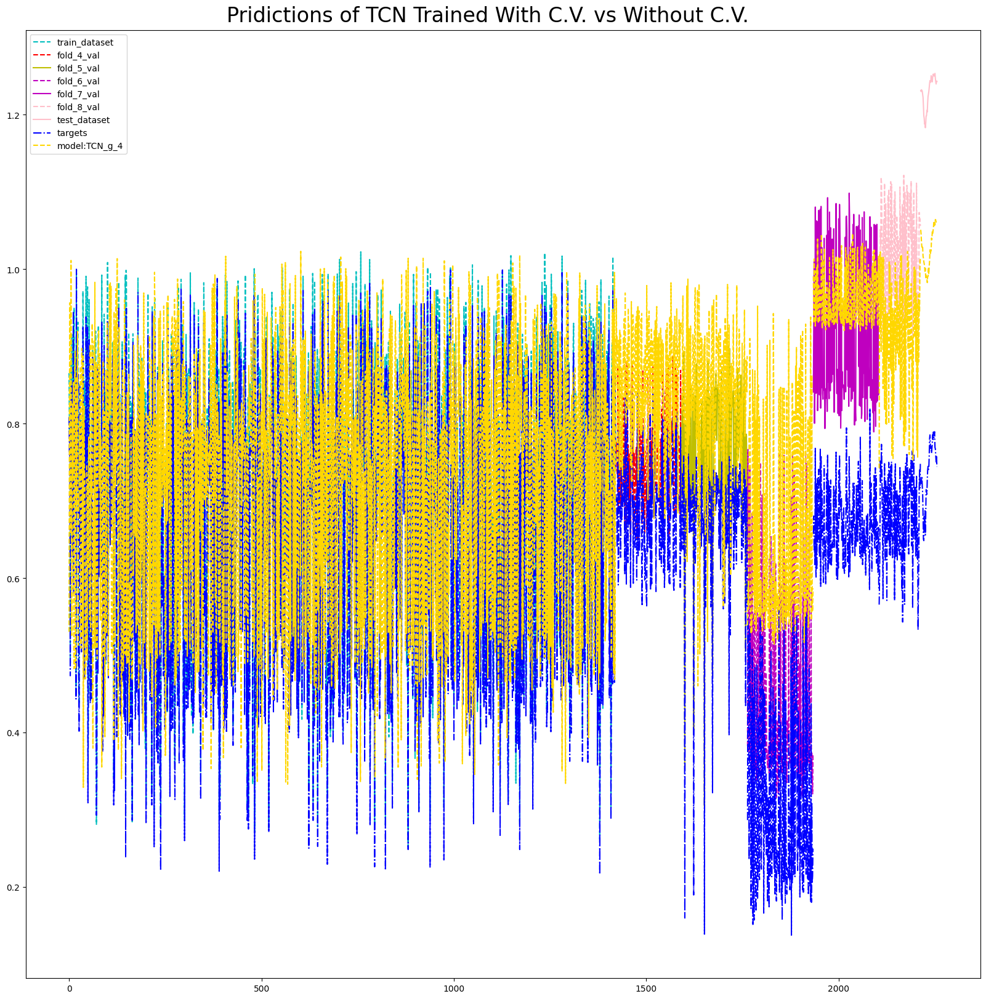

In [191]:
# define starting and ending locations for different validation data plots
l0 = len(pred_ctrl_cv)
l1 = len(pred_ctrl_cv)+len(pred_g_cv[4])
l2 = len(pred_ctrl_cv)+len(pred_g_cv[4])+len(pred_g_cv[5])
l3 = len(pred_ctrl_cv)+len(pred_g_cv[4])+len(pred_g_cv[5])+len(
        pred_g_cv[6])
l4 = len(pred_ctrl_cv)+len(pred_g_cv[4])+len(pred_g_cv[5])+len(
        pred_g_cv[6])+len(pred_g_cv[7])
l5 = len(pred_ctrl_cv)+len(pred_g_cv[4])+len(pred_g_cv[5])+len(
        pred_g_cv[6])+len(pred_g_cv[7])+len(pred_g_cv[8])
l6 = len(pred_ctrl_cv)+len(pred_g_cv[4])+len(pred_g_cv[5])+len(
        pred_g_cv[6])+len(pred_g_cv[7])+len(pred_g_cv[8])+len(pred_g_cv[9])

# plot predictions
fig = plt.figure(figsize=(20, 20))
fig.suptitle('Pridictions of TCN Trained With C.V. vs Without C.V.',
             fontsize=24, y=0.9)
plt.plot(range(l0), pred_ctrl_cv, 'c--', label='train_dataset')
plt.plot(range(l0,l1), pred_g_cv[4],'r--', label='fold_4_val')
plt.plot(range(l1,l2), pred_g_cv[5],'y-', label='fold_5_val')
plt.plot(range(l2,l3),pred_g_cv[6],'m--', label='fold_6_val')
plt.plot(range(l3,l4),pred_g_cv[7],'m-', label='fold_7_val')
plt.plot(range(l4,l5),pred_g_cv[8],'--',color='pink', label='fold_8_val')
plt.plot(range(l5,l6),pred_g_cv[9],'-',color='pink', label='test_dataset')
                   

# plot actual target datasets
plt.plot(range(l0), target_ctrl_cv, 'b-.')
plt.plot(range(l0,l1), targets_cv[4],'b-.', label='targets')
plt.plot(range(l1,l2), targets_cv[5],'b-.')
plt.plot(range(l2,l3),targets_cv[6],'b-.')
plt.plot(range(l3,l4),targets_cv[7],'b-.')
plt.plot(range(l4,l5),targets_cv[8],'b-.')
plt.plot(range(l5,l6),targets_cv[9],'b-.')

# plot predictions from previous model without doing cross-validation
plt.plot(range(l0), pred_ctrl_4, '--', color='gold')
plt.plot(range(l0,l1), pred_g_4[4],'--', color='gold', label='model:TCN_g_4')
plt.plot(range(l1,l2), pred_g_4[5],'--', color='gold')
plt.plot(range(l2,l3),pred_g_4[6],'--', color='gold')
plt.plot(range(l3,l4),pred_g_4[7],'--', color='gold')
plt.plot(range(l4,l5),pred_g_4[8],'--', color='gold')
plt.plot(range(l5,l6),pred_g_4[9],'--', color='gold')

plt.legend()
plt.plot()

# save the above figure
fig.savefig('images/Predictions with cv vs without cv).png',
            dpi='figure', facecolor='white')


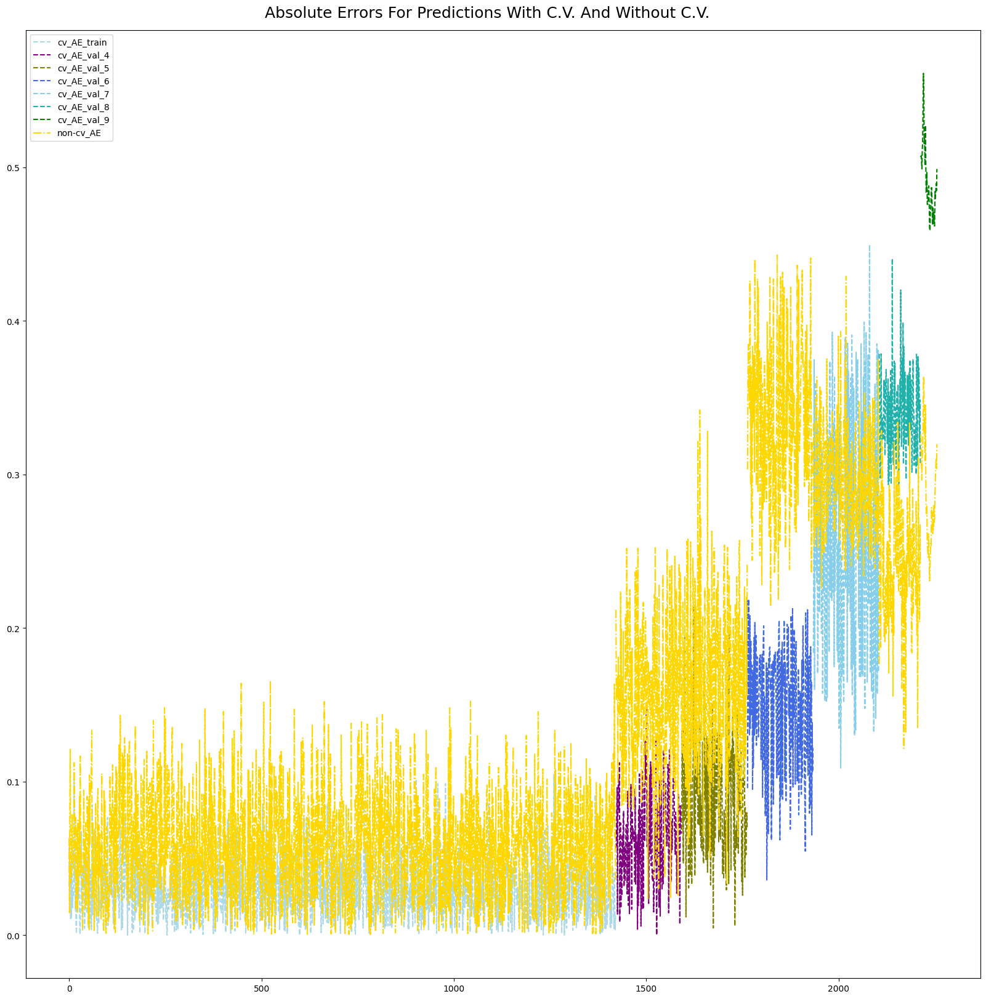

In [192]:
# define starting and ending locations for different validation data plots
l0 = len(pred_ctrl_cv)
l1 = len(pred_ctrl_cv)+len(pred_g_cv[4])
l2 = len(pred_ctrl_cv)+len(pred_g_cv[4])+len(pred_g_cv[5])
l3 = len(pred_ctrl_cv)+len(pred_g_cv[4])+len(pred_g_cv[5])+len(
        pred_g_cv[6])
l4 = len(pred_ctrl_cv)+len(pred_g_cv[4])+len(pred_g_cv[5])+len(
        pred_g_cv[6])+len(pred_g_cv[7])
l5 = len(pred_ctrl_cv)+len(pred_g_cv[4])+len(pred_g_cv[5])+len(
        pred_g_cv[6])+len(pred_g_cv[7])+len(pred_g_cv[8])
l6 = len(pred_ctrl_cv)+len(pred_g_cv[4])+len(pred_g_cv[5])+len(
        pred_g_cv[6])+len(pred_g_cv[7])+len(pred_g_cv[8])+len(pred_g_cv[9])
fig = plt.figure(figsize=(20, 20))
fig.suptitle('Absolute Errors For Predictions With C.V. And Without C.V.',
             fontsize=18, y=0.9)
# plot absolute errors from cross-validated model
plt.plot(range(l0), abs(np.array(pred_ctrl_cv)-np.array(target_ctrl_cv)),
         '--', color='lightblue', label='cv_AE_train')
plt.plot(range(l0,l1), abs(np.array(pred_g_cv[4])-np.array(targets_cv[4])),
         '--', color='purple', label='cv_AE_val_4')
plt.plot(range(l1,l2), abs(np.array(pred_g_cv[5])-np.array(targets_cv[5])),
         '--', color='olive', label='cv_AE_val_5')
plt.plot(range(l2,l3),abs(np.array(pred_g_cv[6])-np.array(targets_cv[6])),
         '--', color='royalblue', label='cv_AE_val_6')
plt.plot(range(l3,l4),abs(np.array(pred_g_cv[7])-np.array(targets_cv[7])),
         '--', color='skyblue', label='cv_AE_val_7')
plt.plot(range(l4,l5),abs(np.array(pred_g_cv[8])-np.array(targets_cv[8])),
         '--', color='lightseagreen', label='cv_AE_val_8')
plt.plot(range(l5,l6),abs(np.array(pred_g_cv[9])-np.array(targets_cv[9])),
         '--', color='green', label='cv_AE_val_9')

# plot absolute errors from non cross-validated model
plt.plot(range(l0), abs(np.array(pred_ctrl_4)-np.array(target_ctrl_4)),
         '-.', label='non-cv_AE', color='gold')
plt.plot(range(l0,l1), abs(np.array(pred_g_4[4])-np.array(targets_4[4])),
         '-.', color='gold')
plt.plot(range(l1,l2), abs(np.array(pred_g_4[5])-np.array(targets_4[5])),
         '-.', color='gold')
plt.plot(range(l2,l3),abs(np.array(pred_g_4[6])-np.array(targets_4[6])),
         '-.', color='gold')
plt.plot(range(l3,l4),abs(np.array(pred_g_4[7])-np.array(targets_4[7])),
         '-.', color='gold')
plt.plot(range(l4,l5),abs(np.array(pred_g_4[8])-np.array(targets_4[8])),
         '-.', color='gold')
plt.plot(range(l5,l6),abs(np.array(pred_g_4[9])-np.array(targets_4[9])),
         '-.', color='gold')

plt.legend()
plt.plot()

# save the above figure
fig.savefig('images/AE_for_Predictions_with_cv_and_predictions_without_cv.png',
            dpi='figure', facecolor='white')

cross-validation trained model presented better model predictability in the near future while worse generalization capability for further unseen datasets.  

## Evaluate variables impact
In this section, we will use the architecture of the optimized TCN model, and train the model with walk-forward cross-validation. After that, train the model on the whole train_val dataset and evaluate the model on the unseen test dataset. 

To be specific, we use 'train_val_ifold' datasets to train a newly instantiated TCN model via walk-forward cross-validation. Then, retrain the model with 'train_val_tensor', and finally validate the model on the unseen 'test_dataset'.

### Control group: training the optimal TCN model on the full set of variables

#### Build TCN model with opt_TCN architecture

In [193]:
# load optimal TCN model
opt_TCN = load_model('final_TCN.keras', custom_objects={'TCN': TCN})

# instantiate a model with the same architecture
new_TCN = adapt_model(opt_TCN, (40,49))

#### Retrain the model on the whole training dataset and evaluate performance

In [194]:
#train the model on the whole training dataset
new_TCN.fit(train_val_tensor, epochs=final_TCN_epochs, verbose=0)

In [195]:
# evaluate model performance
# define control group as group B
mae_control = new_TCN.evaluate(test_dataset)[-1]
print('Control group MAE: ', mae_control)
#retrain the model on the whole training dataset
targets_test=[]
pred_control=[]
for samples, targets in test_dataset:
    targets_test.extend(targets.numpy())
    prd =new_TCN.predict(samples).ravel()
    pred_control.extend(prd)
pred_control_ = new_TCN.predict(test_dataset).ravel()
AE_control = abs(np.array(pred_control) - np.array(targets_test))


1/1 [==============================] - 1s 945ms/step - loss: 0.0035 - mape: 6.9644 - mae: 0.0513
Control group MAE:  0.05129449442028999
1/1 [==============================] - 1s 850ms/step


### Evaluating different groups of variables' impact on model performance

In [196]:
# recap groups of variables we have defined previously
groups = {'prim_V':['Open', 'High', 'Low', 'Close', 'Volume', 'day', 'trends',
                    '1st_diff', 'vola'],
          'TI_V':['EMA20', 'rsi', 'EMA50', 'EMA5', 'EMA200', 'EMA10', 'EMA100'],
          'US_V': ['AAPL', 'MSFT','GOOG', 'AMZN','NVDA','TSLA', 'META','BRK-A',
                   'V', 'UNH'] ,
          'Commodities_V': ['CL=F', 'GC=F'],
          'indices_V':['^GSPC', '^DJI', '^FTSE', '^FTMC', '^HSI', '000001.SS',
                       '^AEX', '^KLSE', '^N225'],
          'currencies_V':['SGD','EUR','GBP','CNY','HKD','JPY','MYR'],
          'TB_V':['^IRX', '^FVX', '^TNX', '^TYX'],
          'ir_V': ['comp_sora_3m']
         }


In [197]:
# reduce interest rates
ir_stats, ir_pvalue, ir_result, ir_evaluate, ir_pred = AB_test(groups['ir_V'],
                                                               mae_control,
                                                               AE_control,
                                                               tscv,
                                                               epochs=final_TCN_epochs)

test_df:  (122, 48)
train_val:  (2747, 48)
window length:  40
Number of features:  48


In [198]:
# reduce interest rates
TB_stats, TB_pvalue, TB_result, TB_evaluate, TB_pred = AB_test(groups['TB_V'], 
                                                               mae_control, 
                                                               AE_control,
                                                               tscv,
                                                               epochs=final_TCN_epochs)

test_df:  (122, 45)
train_val:  (2747, 45)
window length:  40
Number of features:  45


In [199]:
# reduce interest rates
currencies_stats,currencies_pvalue,currencies_result,currencies_evaluate,currencies_pred= AB_test(
                                                            groups['currencies_V'],
                                                            mae_control,
                                                            AE_control,
                                                            tscv,
                                                            epochs=final_TCN_epochs)

test_df:  (122, 42)
train_val:  (2747, 42)
window length:  40
Number of features:  42


In [200]:
# reduce interest rates
indices_stats, indices_pvalue, indices_result, indices_evaluate, indices_pred = AB_test(
                                                            groups['indices_V'],
                                                            mae_control,
                                                            AE_control,
                                                            tscv,
                                                            epochs=final_TCN_epochs)

test_df:  (122, 40)
train_val:  (2747, 40)
window length:  40
Number of features:  40


In [201]:
# reduce interest rates
Commodities_stats,Commodities_pvalue,Commodities_result,Commodities_evaluate,Commodities_pred=AB_test(
                                                            groups['Commodities_V'],
                                                            mae_control,
                                                            AE_control,
                                                            tscv,
                                                            epochs=final_TCN_epochs)

test_df:  (122, 47)
train_val:  (2747, 47)
window length:  40
Number of features:  47


In [202]:
# reduce interest rates
US_stats,US_pvalue,US_result,US_evaluate,US_pred = AB_test(groups['US_V'],
                                                           mae_control, 
                                                           AE_control,
                                                           tscv,
                                                           epochs=final_TCN_epochs)

test_df:  (122, 39)
train_val:  (2747, 39)
window length:  40
Number of features:  39


In [203]:
# reduce interest rates
TI_stats, TI_pvalue, TI_result, TI_evaluate, TI_pred = AB_test(groups['TI_V'],
                                                               mae_control, 
                                                               AE_control,
                                                               tscv,
                                                               epochs=final_TCN_epochs)

test_df:  (122, 42)
train_val:  (2747, 42)
window length:  40
Number of features:  42


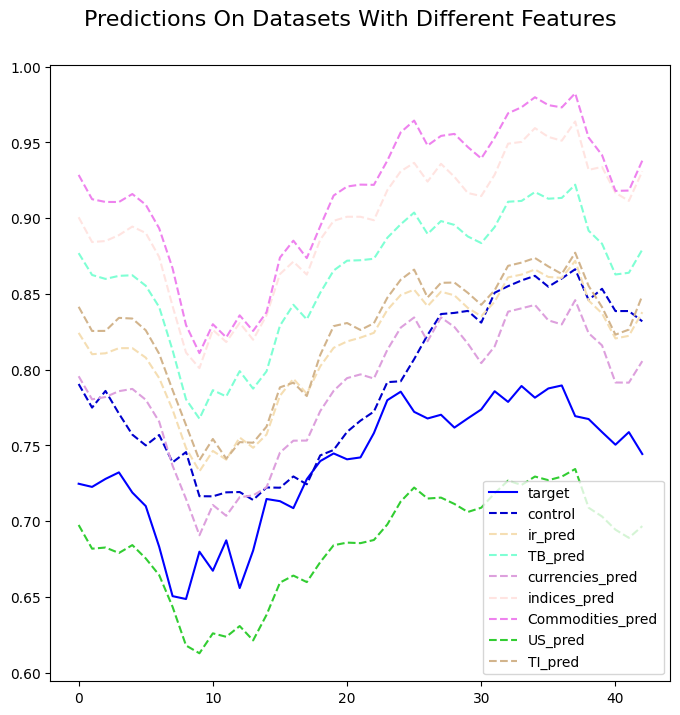

In [204]:
fig=plt.figure(figsize=(8,8))
fig.suptitle('Predictions On Datasets With Different Features', fontsize=16, y=0.95)
x=range(len(targets_test))
plt.plot(x, targets_test, '-', label='target', color='blue')
plt.plot(x, pred_control, '--', label='control', color='mediumblue')
plt.plot(x, ir_pred, '--', label='ir_pred', color='wheat')
plt.plot(x, TB_pred, '--', label='TB_pred', color='aquamarine')
plt.plot(x, currencies_pred, '--', label='currencies_pred', color='plum')
plt.plot(x, indices_pred, '--', label='indices_pred', color='mistyrose')
plt.plot(x, Commodities_pred, '--', label='Commodities_pred', color='violet')
plt.plot(x, US_pred, '--', label='US_pred', color='limegreen')
plt.plot(x, TI_pred, '--', label='TI_pred', color='tan')
plt.legend()
plt.show()

# save the above figure
fig.savefig('images/Predictions on datasets with different features.png',
            dpi='figure', facecolor='white')

In [205]:
feature_summary = pd.DataFrame([mae_control, 'Nil', 'Nil', 'This is the control group.'],
                               index=['MAE', 'stats', 'p_value', 'result']
                              ).rename(columns={0:'control'})


In [206]:
pd.set_option('display.max_rows', None)
feature_summary['reducing ir'] = [ir_evaluate, ir_stats, ir_pvalue, ir_result]
feature_summary['reducing TB'] = [TB_evaluate, TB_stats, TB_pvalue, TB_result]
feature_summary['reducing currencies'] = [currencies_evaluate, currencies_stats,
                                          currencies_pvalue, currencies_result]
feature_summary['reducing indices'] =  [indices_evaluate, indices_stats, 
                                        indices_pvalue, indices_result]
feature_summary['reducing Commodities'] = [Commodities_evaluate, Commodities_stats,
                                           Commodities_pvalue, Commodities_result]
feature_summary['reducing US'] = [US_evaluate, US_stats, US_pvalue, US_result]
feature_summary['reducing TI'] = [TI_evaluate, TI_stats, TI_pvalue, TI_result]

# save results
feature_summary.T.to_excel('images/Table9_Predictions on datasets with reduced features.xlsx')
feature_summary.T

,MAE,stats,p_value,result
control,0.051294,Nil,Nil,This is the control group.
reducing ir,0.077982,5.180801,0.000002,Prediction on group A is significantly worse than the control group
reducing TB,0.124639,14.067632,0.0,Prediction on group A is significantly worse than the control group
reducing currencies,0.049236,-0.386022,0.700658,Prediction on group A is NOT statistically significantly different from the control group
reducing indices,0.159333,20.653295,0.0,Prediction on group A is significantly worse than the control group
reducing Commodities,0.176863,22.746208,0.0,Prediction on group A is significantly worse than the control group
reducing US,0.052789,0.297872,0.766757,Prediction on group A is NOT statistically significantly different from the control group
reducing TI,0.086429,6.501285,0.0,Prediction on group A is significantly worse than the control group
